# Who feeds the world ? And how wealthy are they ?
There are **folium maps** in this notebook. If they do not display or do not display well, we suggest you to **have a look at the `.html` file** that is located the same repository.

## Abstract <a name="abstract"></a>

Are countries that plant more maize richer than countries planting rice? Is it true that developed countries produce more meat? Are you better off being a food net exporter or importer? Are food prices more stable if you produce more food locally or trade more?

In this project we analyze **the effects that a country agricultural sector has on its different economic indicators**. The indicators of the agricultural sector we used are crops and livestock **production, exports and imports** of **crops, livestock and live animals**. For these, we use the data from the "**Global Food & Agriculture Statistics**" datasets. We quantify the **economic success** by **Gross Domestic Product (GDP)**, but also by **price stability**, as defined by low changes in **Consumer Price Indices (CPI)**. We further use the **Food and Agriculture Organization (FAO)** definition of **food self-sufficiency** to analyze its link to economic success and stability. 
After finding the results of the agricultural products most highly linked with economic success, we create **visualizations** in the form of **maps**. Through these timeline maps, we show how the production/export/import of important products has developed globally. We also use maps to visualize the **level of food self-sufficiency and price stability**.




## Research questions <a name="abstract2"></a>

We would like to work on the following research questions:

- Which **agricultural products** are the **most produced/exported/imported** globally?
- Which of them are **correlated more highly with GDP**?
- Can we **predict** which countries will have **further GDP growth** based on the repartition of their agricultural sector?
- How can we define **price stability**? How can we define **food self-sufficiency**? Is there a link?
- What is countries **agricultural trade balance**? Are countries that are net exporters or importers richer ? Are self-sufficient countries **richer** ?
- How does the geographical repartition of important agricultural products look like? Which countries are **net food exporters or importers**? How did this **evolve over the last few decades** ?


# Table of contents <a name="toc"></a>


[Abstract](#abstract)

[Research questions](#abstract2) 

[Table of contents](#toc)

1. [Data cleansing and preprocessing](#1)

    1. [Dataset description](#1A)   
    
    2. [Loading the data set](#1B)
    
    3. [Understanding the data set](#1C)
    
    4. [Cleansing the data set](#1D)
        
    5. [Preprocessing the data set](#1E)
        
    6. [Making one uniformized dataframe](#1F)
    
    7. [The last filter](#1G)
        
2. [Data exploration and first observations](#2)
        
    1. [Food productions, importations and exportations](#2A)
            
    2. [Consumer price indices](#2B)  
                
    3. [Structure of international trade and historical context](#2C)      
        
    4. [Economic classification of countries](#2D)    
        
3. [Descriptive data analysis](#3)

    1. [Production and consumption of food from a time-space geography point of view](#3A)

    2. [Food self-sufficiency](#3B)

    3. [Analysis of food production and trade with GDP](#3C)

    4. [Food prices stability and agricultural features](#3D)      

4. [Informed plan for next actions](#4)

**External imports:**

In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import folium
import seaborn as sns
import json
import re
import requests
from bs4 import BeautifulSoup
from ipywidgets import interact
from IPython.display import display
import scipy.cluster.hierarchy as spc
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import Ridge
from operator import itemgetter
from sklearn import preprocessing
from tqdm import tqdm

**Setup:**

In [2]:
data_folder_path = "Scripts/Data/current_FAO/raw_files/"

files = {"Crops production" : "Production_Crops_E_All_Data_(Normalized).csv",
         "Food trade" : "Trade_Crops_Livestock_E_All_Data_(Normalized).csv", 
         "Consumer price indices" : "ConsumerPriceIndices_E_All_Data_(Normalized).csv",
         "Macroeconomy" : "Macro-Statistics_Key_Indicators_E_All_Data_(Normalized).csv",
         "Livestock production" : "Production_Livestock_E_All_Data_(Normalized).csv",
         "Live animals trade" : "Trade_LiveAnimals_E_All_Data_(Normalized).csv"
        }
interesting_datasets = files.keys()

## 1. Data cleansing and preprocessing <a name="1"></a>

In this part, we will load, explore and clean the dataset in order to remove typing errors, missing information, inaccuracies, and so on.

1. 

    1. [Dataset description](#1A)   
    
    2. [Loading the data set](#1B)
    
    3. [Understanding the data set](#1C)
    
    4. [Cleansing the data set](#1D)
    
        1. [Removing unuseful data](#1Da)         
        
        2. [Handling of the missing data](#1Db)       
        
    5. [Preprocessing the data set](#1E)
    
        1. [Converting country names between different naming conventions](#1Ea)
        
        2. [Normalization and log scales](#1Eb)
        
    6. [Making one uniformized dataframe](#1F)

### 1.A. Dataset description <a name="1A"></a>

Our main dataset is a subset of the **"Global Food & Agriculture Statistics"** that is found **in the proposed datasets list**. In this dataset, we have seen that we could work with the **production** as well as **import** and **export** quantities **per year** and **per country**. As far as food is concerned, we use **crops**, **livestock** and **live animals**. We have also found pieces of information about countries **GDP** and **CPI** in this database.

This database countains several files. We had a look of all the files. For food-related data about countries, we decided to focus on the following files:
- `Production_Crops_E_All_Data_(Normalized).csv` contains data about **crops production**.
- `Trade_Crops_Livestock_E_All_Data_(Normalized).csv` contains data about **food trade** (crops and livestock).
- `Production_Livestock_E_All_Data_(Normalized).csv` contains data about **livestock production**.
- `Trade_LiveAnimals_E_All_Data_(Normalized).csv` contains data about **live animals trade**.

For food-related data about countries, we decided to focus on the following files:
- `ConsumerPriceIndices_E_All_Data_(Normalized).csv` contains data about **consumer price indices (CPI)**.
- `Macro-Statistics_Key_Indicators_E_All_Data_(Normalized).csv` contains data about **gross domestic product (GDP)** along with other macroeconomic indicators.

### 1.B. Loading the data set  <a name="1B"></a>

In [3]:
def load_datasets(datasets) :
    df = {}
    for dataset in datasets :
        file_path = data_folder_path + files[dataset]
        df[dataset] = pd.read_csv(file_path, encoding = "ISO-8859-1")
    return df

We **load each interresting dataset** in the dictionary `df` :

In [4]:
df = load_datasets(interesting_datasets)

### 1.C. Understanding the data set  <a name="1C"></a>

In this part, we will have a first look of the datasets in order to **get a first sense of the data**.

In [5]:
def display_df(df, datasets):
    for dataset in datasets :
        display(dataset, df[dataset].sample(5))

In order to see what does the datasets look like, we display a sample of 5 rows for each of them :

In [6]:
display_df(df, interesting_datasets)

'Crops production'

,Area Code,Area,Item Code,Item,Element Code,Element,Year Code,Year,Unit,Value,Flag
21106,4,Algeria,44,Barley,5525,Seed,1974,1974,tonnes,66076.0,Fc
1236069,159,Nigeria,116,Potatoes,5312,Area harvested,2000,2000,ha,212000.0,NaN
2451416,5706,European Union,773,Flax fibre and tow,5312,Area harvested,2013,2013,ha,84001.0,A
2031054,5105,Western Africa,836,"Rubber, natural",5510,Production,1983,1983,tonnes,163799.0,A
1511365,198,Slovenia,89,Buckwheat,5525,Seed,1998,1998,tonnes,39.0,Fc


'Food trade'

,Area Code,Area,Item Code,Item,Element Code,Element,Year Code,Year,Unit,Value,Flag
6665763,138,Mexico,390,"Juice, tomato",5910,Export Quantity,2007,2007,tonnes,496.0,NaN
11519344,181,Zimbabwe,1966,Wine+Vermouth+Sim.,5922,Export Value,1961,1961,1000 US$,7.0,A
4317766,84,Greece,1242,"Margarine, short",5610,Import Quantity,1986,1986,tonnes,1395.0,NaN
8069899,170,Peru,10,Total Merchandise Trade,5922,Export Value,2002,2002,1000 US$,7714000.0,*
1567984,27,Bulgaria,235,"Nuts, prepared (exc. groundnuts)",5922,Export Value,1976,1976,1000 US$,NaN,M


'Consumer price indices'

,Area Code,Area,Item Code,Item,Months Code,Months,Year Code,Year,Unit,Value,Flag,Note
14380,250,Democratic Republic of the Congo,23013,"Consumer Prices, Food Indices (2010 = 100)",7004,April,2014,2014,NaN,120.736391,X,2009M12
13703,50,Cyprus,23013,"Consumer Prices, Food Indices (2010 = 100)",7009,September,2015,2015,NaN,99.465749,X,2015
10000,37,Central African Republic,23012,"Consumer Prices, General Indices (2010 = 100)",7003,March,2009,2009,NaN,98.427586,X,2010
40715,180,Palau,23013,"Consumer Prices, Food Indices (2010 = 100)",7009,September,2001,2001,NaN,80.700000,X,2008Q2
57292,229,United Kingdom,23013,"Consumer Prices, Food Indices (2010 = 100)",7005,May,2017,2017,NaN,99.600000,X,2015


'Macroeconomy'

,Area Code,Area,Item Code,Item,Element Code,Element,Year Code,Year,Unit,Value,Flag
277019,256,Luxembourg,22075,Value Added (Total Manufacturing),6109,Value Local Currency,1997,1997,millions,1865.804000,XAM
565318,5801,Least Developed Countries,22016,"Value Added (Agriculture, Forestry and Fishing)",6131,"Annual growth US$, 2005 prices",1985,1985,%,3.220903,Fc
61389,20,Botswana,22008,Gross Domestic Product,6108,"Value US$, 2005 prices",2007,2007,millions,11652.991301,XAM
253560,118,Kuwait,22075,Value Added (Total Manufacturing),6156,"Annual growth Local Currency, 2005 prices",2001,2001,%,-6.000000,Fc
106426,44,Colombia,22008,Gross Domestic Product,6108,"Value US$, 2005 prices",1977,1977,millions,56772.281971,XAM


'Livestock production'

,Area Code,Area,Item Code,Item,Element Code,Element,Year Code,Year,Unit,Value,Flag
17161,27,Bulgaria,1079,Turkeys,5112,Stocks,1968,1968,1000 Head,1293.0,NaN
88790,166,Panama,1749,Sheep and Goats,5111,Stocks,1983,1983,Head,6200.0,A
120967,229,United Kingdom,976,Sheep,5111,Stocks,2006,2006,Head,34722000.0,NaN
5550,10,Australia,1096,Horses,5111,Stocks,1968,1968,Head,448000.0,F
87151,221,Oman,2029,Poultry Birds,5112,Stocks,2008,2008,1000 Head,4280.0,A


'Live animals trade'

,Area Code,Area,Item Code,Item,Element Code,Element,Year Code,Year,Unit,Value,Flag
16854,1,Armenia,1034,Pigs,5908,Export Quantity,2003,2003,Head,2.0,F
479493,225,United Arab Emirates,1126,Camels,5908,Export Quantity,2011,2011,Head,8946.0,R
660884,5817,Net Food Importing Developing Countries,1096,Horses,5608,Import Quantity,2007,2007,Head,6438.0,A
629415,5501,Australia & New Zealand,1079,Turkeys,5922,Export Value,1986,1986,1000 US$,0.0,A
229559,104,Ireland,1171,Animals live nes,5622,Import Value,1963,1963,1000 US$,296.0,NaN


At first glance, our datasets **seem very clean**.

Each of our dataset contains **a column "Year"** and a column that is named **"Area"**. This is a great news for us since we want to do a both **geographical and time-related analysis**.

The column **"Area"** correspond to the country except it **may contains a group of country** (e.g. "Eastern Europe").

### 1.D. Cleansing the data set  <a name="1D"></a>

In this part, we will **clean the datasets**. The **final goal is to produce one uniformized dataset** on which we could work (see [1.F.](#1F)).

In a very simplistic way, such a cleaned and uniformized dataset may look like this :

    Country | Year | GDP | CPI | Food production features | Food trade features

1.  
    4. 
    
        1. [Removing unusefull data](#1Da)         
    
            1. [Extracting GDP from the "Macroeconomy" dataset](#1Dai)
            
            2. [Extracting crops harvested area, production, seed and yield from the "Crops production" dataset](#1Daii)
            
            3. [Extracting stocks production from the "Livestock production" dataset](#1Daiii)
            
            4. [Extracting import and export quantities from the "Live animals trade" and "Crops trade" datasets](#1Daiv)
            5. [Extracting average CPI of each year from the "Consumer price indices" dataset](#1Dav)
            
            6. [Removing areas which are not countries](#1Davi)
        
        2. [Handling of the missing data](#1Db)
        
            1. [Highlighting the problem](#1Dbi)
            
            2. [Proposed correction](#1Dbii)     

#### 1.D.a. Removing unuseful data  <a name="1Da"></a>

In this section, we will create dataframes in `df_useful` which correspond to previous dataframes **without the unuseful data**.

In [7]:
df_useful = {}

##### 1.D.a.i. Extracting GDP from the "Macroeconomy" dataset <a name="1Dai"></a>
The "Macroeconomy" dataset contains **many different measures**: Gross Fixed Capital Formation, Gross National Income, Value Added (Total Manufacturing), ... We are **only interested in Gross Domestic Product**. Therefore, we extract it Gross Domestic Product from the "Macroeconomy" dataset. In order to have uniformisation among values, we choose the US$ value. All of them have the same unit (millions US\\$) so we can drop the "Unit" column as well.

In [8]:
def extract_GDP(df):
    def selection_GDP(df):
        return df['Item']=='Gross Domestic Product'
    def selection_US_dollars(df):
        return df['Element']=="Value US$"
    def drop_columns(df):
        dropped_colmuns = ["Item Code", "Item", "Element Code", "Element", "Flag", "Year Code", "Unit"]
        return df.drop(columns = dropped_colmuns)
    return drop_columns(df[selection_GDP(df)&selection_US_dollars(df)])

In [9]:
df_useful["GDP"] = extract_GDP(df["Macroeconomy"])

We can have have a look at a sample of the extrated dataset:

In [10]:
display(df_useful["GDP"].sample(5))

,Area Code,Area,Year,Value
403276,244,Samoa,1980,1.120410e+02
550681,5305,Western Asia,1994,5.635896e+05
63823,21,Brazil,2010,2.208838e+06
395737,188,Saint Kitts and Nevis,2004,5.025613e+02
413351,195,Senegal,1981,2.699144e+03


And we can plot GDP in million US$ for different countries for the period 1970-2015:

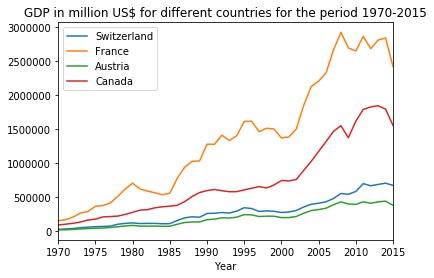

In [11]:
select_switzerland = df_useful["GDP"]['Area']=='Switzerland'
select_france = df_useful["GDP"]['Area']=='France'
select_austria = df_useful["GDP"]['Area']=='Austria'
select_canada = df_useful["GDP"]['Area']=='Canada'
ax = df_useful["GDP"][select_switzerland].plot(x ='Year', y='Value', kind = 'line')
ax = df_useful["GDP"][select_france].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = df_useful["GDP"][select_austria].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = df_useful["GDP"][select_canada].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["Switzerland", 'France', 'Austria', "Canada"])
_ = ax.set_title('GDP in million US$ for different countries for the period 1970-2015')

For dissolute or new countries, we have some Nan values (before appearing or after dissolution) as in this next example :

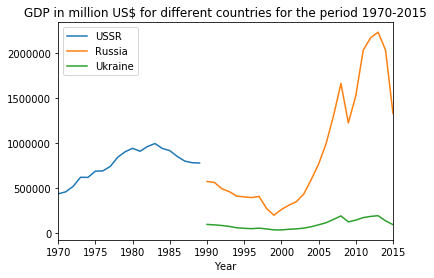

In [12]:
select_USSR = df_useful["GDP"]['Area']=='USSR'
select_russia = df_useful["GDP"]['Area']=='Russian Federation'
select_ukraine = df_useful["GDP"]['Area']=='Ukraine'
ax = df_useful["GDP"][select_USSR].plot(x ='Year', y='Value', kind = 'line')
ax = df_useful["GDP"][select_russia].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = df_useful["GDP"][select_ukraine].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["USSR", 'Russia', 'Ukraine'])
_ = ax.set_title('GDP in million US$ for different countries for the period 1970-2015')

##### 1.D.a.ii. Extracting crops harvested area, production, seed and yield from the "Crops production" dataset<a name="1Daii"></a>
We want to extract crops **harvested area**, **production**, **seed** and **yield** from the **"Crops production" dataset**. As all crops are not food crops, we request the [World crops database](https://world-crops.com/food-crops/) to **keep only the food crops**.

In [13]:
def get_food_crops():
    #Return a list of crops categorized as food crops https://world-crops.com/food-crops/
    url="https://world-crops.com/food-crops/"
    r=requests.get(url,headers={"User-Agent": "XY"})
    soup=BeautifulSoup(r.text,'html.parser')
    elements_temp=soup.find_all('a',href=re.compile("^../"))
    elements=[el.text for el in elements_temp]
    
    #only 40 elements are displayed on each page->iterating on the total list
    for i in range(40,401,40):
        url_i=url+"?ss="+str(i)
        r=requests.get(url_i,headers={"User-Agent":"XY"})
        soup=BeautifulSoup(r.text,'html.parser')
        new_elements=soup.find_all('a',href=re.compile("^../"))
        elements+=[el.text for el in new_elements]
    return elements

def inclusive_search(string,elements):
    #returns true if the string can be found in elements. The search removes special characters from string in order to include more positive results
    string=string.lower()
    delimiters = ",", "(","&",")"," and "," "
    pattern = '|'.join(map(re.escape, delimiters))
    strings=list(filter(None,re.split(pattern,string)))
    found=False
    for s in strings:
        if s=="nes":
            continue
        for el in elements:
            found=(s in el.split())
            if found==False and s[-1]=="s":
                found=s[:-1] in el.split()
            if found==False and s[-2:]=="es":
                found=s[:-2] in el.split()
            if found==False and s[-3:]=="ies":
                found=s[:-3]+"y" in el.split()
            if found==True:
                return found
    return found


def get_food_crop_data(df):    
    #extracts the food crop data, returns 4 df: Area,Production,Seed and yield    
    df=df.copy()
    food_crops=list(map(lambda x: x.lower(),get_food_crops()))              
    crop_types_df=df[['Item','Value']].groupby('Item').sum()
    crop_types_df=crop_types_df[list(map(lambda x : inclusive_search(x,food_crops) , crop_types_df.index ))]   
    food_crop_df=df[df.Item.apply(lambda x: x in crop_types_df.index)]
    return (food_crop_df[food_crop_df.Element=='Area harvested'],
            food_crop_df[food_crop_df.Element=='Production'],
            food_crop_df[food_crop_df.Element=='Seed'],
            food_crop_df[food_crop_df.Element=='Yield'])
  
food_crop_area_df , food_crop_production_df , food_crop_seed_df , food_crop_yield_df = get_food_crop_data(df["Crops production"])

In [14]:
df_useful['Crops Production'] = food_crop_production_df.drop(columns=['Item Code', "Element Code", "Element", "Year Code", "Flag"])

We check everything is fine by looking at samples for each of the new dataframes:

In [15]:
display('Crops Production', df_useful['Crops Production'].sample(5))

'Crops Production'

,Area Code,Area,Item,Year,Unit,Value
1670376,217,Togo,Sweet potatoes,1964,tonnes,7000.0
1057149,132,Maldives,"Fruit excl Melons,Total",2005,tonnes,10497.0
1337900,171,Philippines,"Oil, palm fruit",2010,tonnes,565460.0
1692449,222,Tunisia,"Fruit, stone nes",1974,tonnes,300.0
611898,67,Finland,Oats,1993,tonnes,1202300.0


We also make some plots to have a first understanding of the dataset:

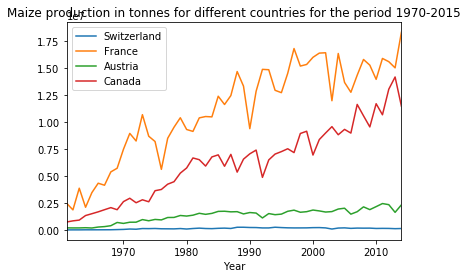

In [16]:
select_Maize = df_useful['Crops Production']['Item']=='Maize'
maize_df = df_useful['Crops Production'][select_Maize]

select_switzerland = maize_df['Area']=='Switzerland'
select_france = maize_df['Area']=='France'
select_austria = maize_df['Area']=='Austria'
select_canada = maize_df['Area']=='Canada'
ax = maize_df[select_switzerland].plot(x ='Year', y='Value', kind = 'line')
ax = maize_df[select_france].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = maize_df[select_austria].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = maize_df[select_canada].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["Switzerland", 'France', 'Austria', "Canada"])
_ = ax.set_title('Maize production in tonnes for different countries for the period 1970-2015')

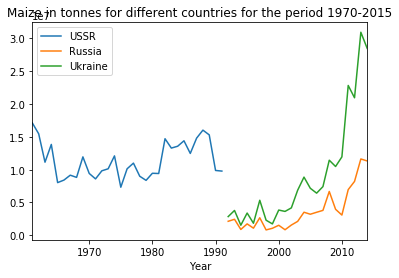

In [17]:
select_USSR = maize_df['Area']=='USSR'
select_russia = maize_df['Area']=='Russian Federation'
select_ukraine = maize_df['Area']=='Ukraine'
ax = maize_df[select_USSR].plot(x ='Year', y='Value', kind = 'line')
ax = maize_df[select_russia].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = maize_df[select_ukraine].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["USSR", 'Russia', 'Ukraine'])
_ = ax.set_title('Maize in tonnes for different countries for the period 1970-2015')

##### 1.D.a.iii. Extracting stocks production from the "Livestock production" dataset<a name="1Daiii"></a>

We want to extract **stocks production** from the **"Livestock production" dataset**. Again, we drop the columns that are useless for us and have a first look of the data with a sample and some plots.

In [18]:
selection_stocks = df['Livestock production']["Element"] == 'Stocks'
df_useful['Livestock production'] = df['Livestock production'][selection_stocks].drop(columns=['Item Code', "Element Code", "Element", "Year Code", "Flag"])

In [19]:
display(df_useful['Livestock production'].sample(5))

,Area Code,Area,Item,Year,Unit,Value
25849,41,"China, mainland",Rabbits and hares,1970,1000 Head,32000.0
38837,61,Equatorial Guinea,Sheep,1971,Head,29000.0
6191,11,Austria,Goats,1961,Head,161813.0
36799,58,Ecuador,Poultry Birds,1985,1000 Head,40931.0
23380,351,China,Buffaloes,1965,Head,11021529.0


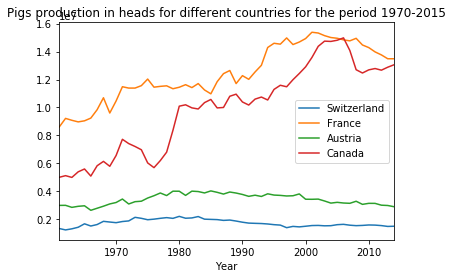

In [20]:
select_pigs = df_useful['Livestock production']['Item']=='Pigs'
pigs_df = df_useful['Livestock production'][select_pigs]

select_switzerland = pigs_df['Area']=='Switzerland'
select_france = pigs_df['Area']=='France'
select_austria = pigs_df['Area']=='Austria'
select_canada = pigs_df['Area']=='Canada'
ax = pigs_df[select_switzerland].plot(x ='Year', y='Value', kind = 'line')
ax = pigs_df[select_france].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = pigs_df[select_austria].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = pigs_df[select_canada].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["Switzerland", 'France', 'Austria', "Canada"])
_ = ax.set_title('Pigs production in heads for different countries for the period 1970-2015')

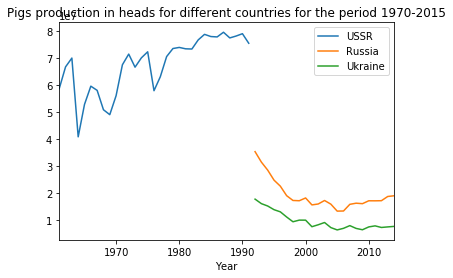

In [21]:
select_USSR = pigs_df['Area']=='USSR'
select_russia = pigs_df['Area']=='Russian Federation'
select_ukraine = pigs_df['Area']=='Ukraine'
ax = pigs_df[select_USSR].plot(x ='Year', y='Value', kind = 'line')
ax = pigs_df[select_russia].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = pigs_df[select_ukraine].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["USSR", 'Russia', 'Ukraine'])
_ = ax.set_title('Pigs production in heads for different countries for the period 1970-2015')

##### 1.D.a.iv. Extracting import and export quantities from the "Live animals trade" and "Crops trade" datasets<a name="1Daiv"></a>
Now, we extract **import and export quantities** from the **"Live animals trade" and "Crops trade" datasets**, having again some samples and some plots.

In [22]:
selection_import_quantities = df['Live animals trade']["Element"] == 'Import Quantity'
selection_export_quantities = df['Live animals trade']["Element"] == 'Export Quantity'

df_useful['Live animals import quantities'] = df['Live animals trade'][selection_import_quantities].drop(columns=['Item Code', "Element Code", "Element", "Year Code", "Flag"])
df_useful['Live animals export quantities'] = df['Live animals trade'][selection_export_quantities].drop(columns=['Item Code', "Element Code", "Element", "Year Code", "Flag"])

In [23]:
display(df_useful['Live animals import quantities'].sample(5))

,Area Code,Area,Item,Year,Unit,Value
344311,221,Oman,Cattle,1976,Head,0.0
560792,5203,Northern America,Cattle,2000,Head,2544083.0
87762,36,Cayman Islands,Chickens,2009,1000 Head,0.0
44767,23,Belize,Horses,2002,Head,33.0
405424,195,Senegal,Goats,2007,Head,210000.0


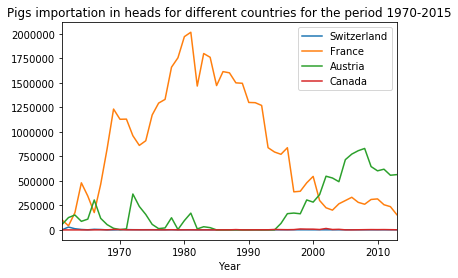

In [24]:
select_pigs = df_useful['Live animals import quantities']['Item']=='Pigs'
pigs_df = df_useful['Live animals import quantities'][select_pigs]

select_switzerland = pigs_df['Area']=='Switzerland'
select_france = pigs_df['Area']=='France'
select_austria = pigs_df['Area']=='Austria'
select_canada = pigs_df['Area']=='Canada'
ax = pigs_df[select_switzerland].plot(x ='Year', y='Value', kind = 'line')
ax = pigs_df[select_france].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = pigs_df[select_austria].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = pigs_df[select_canada].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["Switzerland", 'France', 'Austria', "Canada"])
_ = ax.set_title('Pigs importation in heads for different countries for the period 1970-2015')

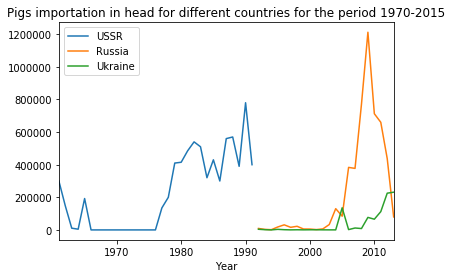

In [25]:
select_USSR = pigs_df['Area']=='USSR'
select_russia = pigs_df['Area']=='Russian Federation'
select_ukraine = pigs_df['Area']=='Ukraine'
ax = pigs_df[select_USSR].plot(x ='Year', y='Value', kind = 'line')
ax = pigs_df[select_russia].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = pigs_df[select_ukraine].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["USSR", 'Russia', 'Ukraine'])
_ = ax.set_title('Pigs importation in head for different countries for the period 1970-2015')

In [26]:
display(df_useful['Live animals export quantities'].sample(5))

,Area Code,Area,Item,Year,Unit,Value
176493,68,France,Sheep and Goats,2003,Head,621734.0
37317,14,Barbados,Sheep,1966,Head,51.0
351698,166,Panama,Chickens,1977,1000 Head,0.0
377177,117,Republic of Korea,Goats,1963,Head,0.0
245070,110,Japan,Pigs,1998,Head,0.0


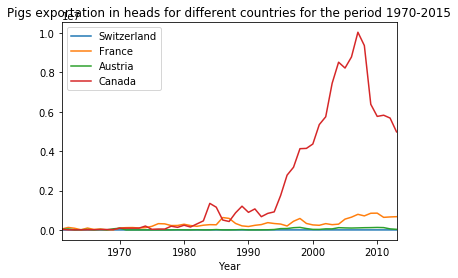

In [27]:
select_pigs = df_useful['Live animals export quantities']['Item']=='Pigs'
pigs_df = df_useful['Live animals export quantities'][select_pigs]

select_switzerland = pigs_df['Area']=='Switzerland'
select_france = pigs_df['Area']=='France'
select_austria = pigs_df['Area']=='Austria'
select_canada = pigs_df['Area']=='Canada'
ax = pigs_df[select_switzerland].plot(x ='Year', y='Value', kind = 'line')
ax = pigs_df[select_france].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = pigs_df[select_austria].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = pigs_df[select_canada].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["Switzerland", 'France', 'Austria', "Canada"])
_ = ax.set_title('Pigs exportation in heads for different countries for the period 1970-2015')

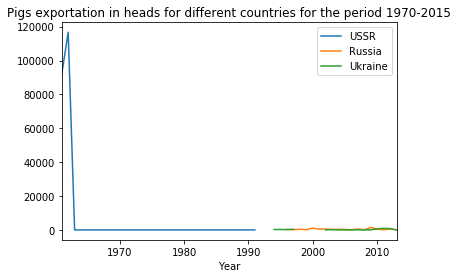

In [28]:
select_USSR = pigs_df['Area']=='USSR'
select_russia = pigs_df['Area']=='Russian Federation'
select_ukraine = pigs_df['Area']=='Ukraine'
ax = pigs_df[select_USSR].plot(x ='Year', y='Value', kind = 'line')
ax = pigs_df[select_russia].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = pigs_df[select_ukraine].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["USSR", 'Russia', 'Ukraine'])
_ = ax.set_title('Pigs exportation in heads for different countries for the period 1970-2015')

In [29]:
selection_import_quantities = df['Food trade']["Element"] == 'Import Quantity'
selection_export_quantities = df['Food trade']["Element"] == 'Export Quantity'

df_useful['Food import quantities'] = df['Food trade'][selection_import_quantities].drop(columns=['Item Code', "Element Code", "Element", "Year Code", "Flag"])
df_useful['Food export quantities'] = df['Food trade'][selection_export_quantities].drop(columns=['Item Code', "Element Code", "Element", "Year Code", "Flag"])

In [30]:
display(df_useful['Food import quantities'].sample(5))

,Area Code,Area,Item,Year,Unit,Value
8130002,171,Philippines,Pet food,2003,tonnes,16528.0
4987143,101,Indonesia,"Cocoa, powder & cake",1973,tonnes,121.0
3301667,56,Dominican Republic,Cloves,2000,tonnes,0.0
10202256,217,Togo,"Coffee, roasted",1962,tonnes,2.0
9350040,25,Solomon Islands,"Spices, nes",1965,tonnes,3.0


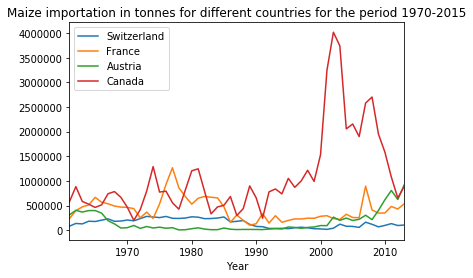

In [31]:
select_Maize = df_useful['Food import quantities']['Item']=='Maize'
maize_df = df_useful['Food import quantities'][select_Maize]

select_switzerland = maize_df['Area']=='Switzerland'
select_france = maize_df['Area']=='France'
select_austria = maize_df['Area']=='Austria'
select_canada = maize_df['Area']=='Canada'
ax = maize_df[select_switzerland].plot(x ='Year', y='Value', kind = 'line')
ax = maize_df[select_france].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = maize_df[select_austria].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = maize_df[select_canada].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["Switzerland", 'France', 'Austria', "Canada"])
_ = ax.set_title('Maize importation in tonnes for different countries for the period 1970-2015')

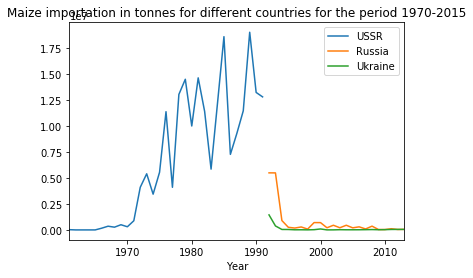

In [32]:
select_USSR = maize_df['Area']=='USSR'
select_russia = maize_df['Area']=='Russian Federation'
select_ukraine = maize_df['Area']=='Ukraine'
ax = maize_df[select_USSR].plot(x ='Year', y='Value', kind = 'line')
ax = maize_df[select_russia].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = maize_df[select_ukraine].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["USSR", 'Russia', 'Ukraine'])
_ = ax.set_title('Maize importation in tonnes for different countries for the period 1970-2015')

In [33]:
display(df_useful['Food export quantities'].sample(5))

,Area Code,Area,Item,Year,Unit,Value
4063968,75,Gambia,"Margarine, liquid",1994,tonnes,NaN
7153792,150,Netherlands,"Pumpkins, squash and gourds",1976,tonnes,0.0
9536488,203,Spain,"Peas, green",2012,tonnes,3943.0
13904641,5502,Melanesia,"Skins, sheep, with wool",2001,tonnes,0.0
13436647,5402,Northern Europe,Copra,1994,tonnes,0.0


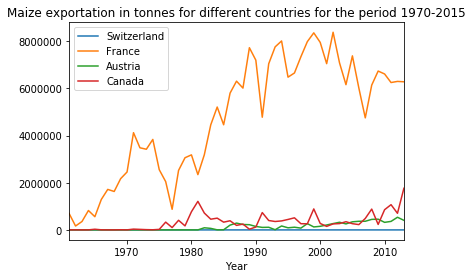

In [34]:
select_Maize = df_useful['Food export quantities']['Item']=='Maize'
maize_df = df_useful['Food export quantities'][select_Maize]

select_switzerland = maize_df['Area']=='Switzerland'
select_france = maize_df['Area']=='France'
select_austria = maize_df['Area']=='Austria'
select_canada = maize_df['Area']=='Canada'
ax = maize_df[select_switzerland].plot(x ='Year', y='Value', kind = 'line')
ax = maize_df[select_france].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = maize_df[select_austria].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = maize_df[select_canada].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["Switzerland", 'France', 'Austria', "Canada"])
_ = ax.set_title('Maize exportation in tonnes for different countries for the period 1970-2015')

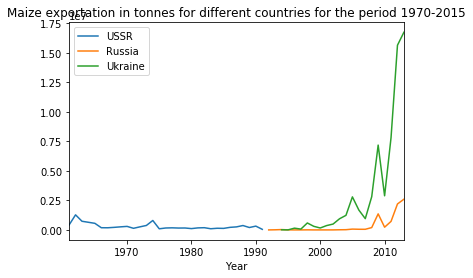

In [35]:
select_USSR = maize_df['Area']=='USSR'
select_russia = maize_df['Area']=='Russian Federation'
select_ukraine = maize_df['Area']=='Ukraine'
ax = maize_df[select_USSR].plot(x ='Year', y='Value', kind = 'line')
ax = maize_df[select_russia].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = maize_df[select_ukraine].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["USSR", 'Russia', 'Ukraine'])
_ = ax.set_title('Maize exportation in tonnes for different countries for the period 1970-2015')

##### 1.D.a.v. Extracting average CPI of each year from the "Consumer price indices" dataset<a name="1Dav"></a>

The **"Consumer price indices" dataset** contains **monthly data**. In order to have a **uniform dataframe**, and as other dataframes have **yearly data**, we will group it by (Country, Year) and compute the monthly mean for every year. Then we add a column to show the relative change in CPI, as this is what measures inflation, according to the following formula:

$$\frac{CPI_t - CPI_{t-1}}{CPI_{t-1}}$$

In [36]:
df_useful['Consumer price indices'] =  df['Consumer price indices'][['Area','Year','Value']] \
                                        .dropna() \
                                        .groupby(['Area',"Year"]) \
                                        .mean() \
                                        .reset_index() \
                                        .dropna()

In [37]:

#We calculate the relative change in CPI for each year relative to last years CPI - this indicates yearly inflation. The first year in each area is set to 0.


df_useful['Consumer price indices']['Value'] = np.where(df_useful['Consumer price indices']['Area'] == df_useful['Consumer price indices']['Area'].shift(1),
         ((df_useful['Consumer price indices']['Value'] - df_useful['Consumer price indices']['Value'].shift(1))/df_useful['Consumer price indices']['Value'].shift(1)) * 100, 0)




In [38]:
display(df_useful['Consumer price indices'].head(5))

,Area,Year,Value
0,Afghanistan,2004,0.000000
1,Afghanistan,2005,11.606340
2,Afghanistan,2006,7.254896
3,Afghanistan,2007,8.482889
4,Afghanistan,2008,30.554940


With samples and plots, we remark that this dataset **only starts in 2000** wheareas other ones start in 1970.

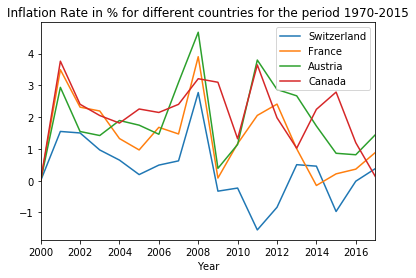

In [39]:
select_switzerland = df_useful['Consumer price indices']['Area']=='Switzerland'
select_france = df_useful['Consumer price indices']['Area']=='France'
select_austria = df_useful['Consumer price indices']['Area']=='Austria'
select_canada = df_useful['Consumer price indices']['Area']=='Canada'
ax = df_useful['Consumer price indices'][select_switzerland].plot(x ='Year', y='Value', kind = 'line')
ax = df_useful['Consumer price indices'][select_france].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = df_useful['Consumer price indices'][select_austria].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = df_useful['Consumer price indices'][select_canada].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["Switzerland", 'France', 'Austria', "Canada"])
_ = ax.set_title('Inflation Rate in % for different countries for the period 1970-2015')

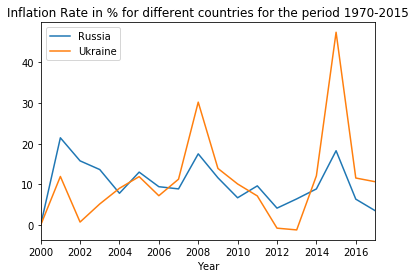

In [40]:
select_russia = df_useful["Consumer price indices"]['Area']=='Russian Federation'
select_ukraine = df_useful["Consumer price indices"]['Area']=='Ukraine'
ax = df_useful["Consumer price indices"][select_russia].plot(x ='Year', y='Value', kind = 'line')
ax = df_useful["Consumer price indices"][select_ukraine].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(['Russia', 'Ukraine'])
_ = ax.set_title('Inflation Rate in % for different countries for the period 1970-2015')

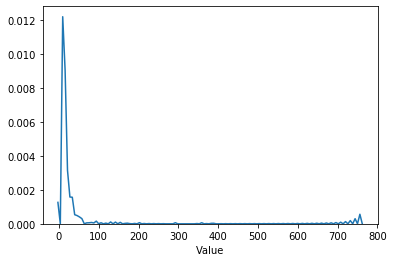

In [41]:
_ = sns.distplot(abs(df_useful["Consumer price indices"]["Value"]), rug=False, hist=False)

In [42]:
#looking at the cases where food prices increased over 100% during one year
df_useful["Consumer price indices"].loc[df_useful["Consumer price indices"]["Value"] > 100]

,Area,Year,Value
55,Angola,2001,152.561015
56,Angola,2002,108.897433
851,Democratic Republic of the Congo,2001,359.936605
1280,Guinea,2010,292.596028
2636,Sao Tome and Principe,2014,759.321212
2801,Solomon Islands,2012,203.559117
2833,South Sudan,2016,386.378414
2834,South Sudan,2017,130.056890
3283,Venezuela (Bolivarian Republic of),2015,171.224360
3284,Venezuela (Bolivarian Republic of),2016,142.586732


It seems that the formula calculating food price inflation is actually correct. These are realistic cases where the price increased by over 100% in the span of a year. 

##### 1.D.a.vi. Removing areas which are not countries <a name="1Davi"></a>

Having a more detailled look at the dataset, we have remarked that the **areas which are real countries** are exactely the ones with an "Area Code" below $5000$ but not in $[261, 269]$.

In [43]:
#remove Area code >= 5000 or in [261, 269] (EU)
for df_name in df_useful :
    if 'Area Code' in df_useful[df_name].keys() : 
        print ("Removing areas which are not countries in", df_name)
        selection_countries = df_useful[df_name]['Area Code']<261 
        selection_countries = selection_countries | (df_useful[df_name]['Area Code']>269)
        selection_countries = selection_countries & (df_useful[df_name]['Area Code']<5000)
        df_useful[df_name] = df_useful[df_name][selection_countries]
        display(df_useful[df_name].sample(5))
    else :
        print (df_name, "is already clean")

Removing areas which are not countries in GDP


,Area Code,Area,Year,Value
268494,124,Libya,1971,4.880523e+03
61284,20,Botswana,1994,4.259259e+03
104000,41,"China, mainland",1989,4.610651e+05
363536,168,Papua New Guinea,2009,1.155040e+04
502475,231,United States of America,1975,1.688900e+06


Removing areas which are not countries in Crops Production


,Area Code,Area,Item,Year,Unit,Value
257500,35,Cabo Verde,Cereals (Rice Milled Eqv),2010,tonnes,7047.0
552342,58,Ecuador,"Roots and Tubers,Total",2013,tonnes,419376.0
1409469,182,Réunion,Sweet potatoes,2011,tonnes,1081.0
1604507,210,Sweden,Tomatoes,1978,tonnes,13600.0
1223220,158,Niger,Fonio,1982,tonnes,2300.0


Removing areas which are not countries in Livestock production


,Area Code,Area,Item,Year,Unit,Value
101214,193,Sao Tome and Principe,Goats,1973,Head,1400.0
77123,142,Montserrat,Sheep and Goats,2013,Head,11900.0
55384,99,Iceland,Sheep,2011,Head,475068.0
35586,56,Dominican Republic,Goats,1966,Head,270000.0
86496,299,Occupied Palestinian Territory,Cattle and Buffaloes,1975,Head,0.0


Removing areas which are not countries in Live animals import quantities


,Area Code,Area,Item,Year,Unit,Value
362987,171,Philippines,Mules,1977,Head,NaN
211060,95,Honduras,Turkeys,1961,1000 Head,NaN
166063,64,Faroe Islands,Horses,1961,Head,0.0
293050,136,Mauritania,Mules,2000,Head,NaN
195396,86,Grenada,Rabbits and hares,1985,1000 Head,NaN


Removing areas which are not countries in Live animals export quantities


,Area Code,Area,Item,Year,Unit,Value
392857,189,Saint Lucia,Pigs,2001,Head,NaN
148437,56,Dominican Republic,Ducks,2000,1000 Head,NaN
62991,21,Brazil,Sheep and Goats,1989,Head,199.0
16537,1,Armenia,Chickens,1994,1000 Head,NaN
216951,99,Iceland,Sheep,1969,Head,0.0


Removing areas which are not countries in Food import quantities


,Area Code,Area,Item,Year,Unit,Value
3524690,60,El Salvador,Linseed,1999,tonnes,20.0
8061035,170,Peru,Sugar confectionery,1989,tonnes,0.0
4031840,74,Gabon,"Vegetables, preserved nes",1984,tonnes,3612.0
5059444,102,Iran (Islamic Republic of),"Broad beans, horse beans, dry",1982,tonnes,NaN
5388461,106,Italy,Wafers,1975,tonnes,92.0


Removing areas which are not countries in Food export quantities


,Area Code,Area,Item,Year,Unit,Value
6475612,134,Malta,Maple sugar and syrups,1967,tonnes,0.0
2361167,41,"China, mainland","Buttermilk, curdled, acidified milk",1961,tonnes,0.0
4235180,81,Ghana,"Juice, fruit nes",1974,tonnes,NaN
2365244,41,"China, mainland","Cereals, breakfast",2010,tonnes,113643.0
4579462,91,Guyana,"Buttermilk, curdled, acidified milk",1968,tonnes,NaN


Consumer price indices is already clean


#### 1.D.b. Handling of the missing data  <a name="1Db"></a>

In this section, we will explain how we will handle the missing data in previous dataframes for maps.

##### 1.D.b.i. Highlighting the problem  <a name="1Dbi"></a> 

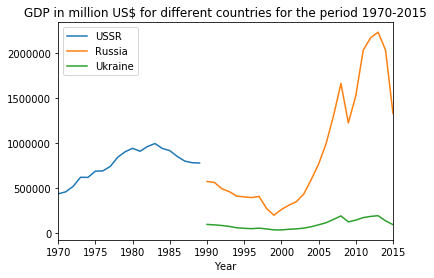

In [44]:
select_USSR = df_useful["GDP"]['Area']=='USSR'
select_russia = df_useful["GDP"]['Area']=='Russian Federation'
select_ukraine = df_useful["GDP"]['Area']=='Ukraine'
ax = df_useful["GDP"][select_USSR].plot(x ='Year', y='Value', kind = 'line')
ax = df_useful["GDP"][select_russia].plot(x ='Year', y='Value', kind = 'line', ax = ax)
ax = df_useful["GDP"][select_ukraine].plot(x ='Year', y='Value', kind = 'line', ax = ax)
_ = ax.legend(["USSR", 'Russia', 'Ukraine'])
_ = ax.set_title('GDP in million US$ for different countries for the period 1970-2015')

In order to **vizualize folium maps**, we need to **associate each country a value**. The geojson file that we use is not timestamped and **only countries that exist nowadays** are inside it. As **some countries has been dissolved** during the past 50 years, our folium maps won't be complete. For instance, we do not have any value for Ukraine from 1970 to 1989. Our idea to fix this issue is presented in the next paragraph.

##### 1.D.b.ii. Proposed correction  <a name="1Dbii"></a> 


Our idea is to **map the former country value to each of the current ones**. For instance in 1982, USSR GDP is around one trillion \\$. Therefore, if we associate (**only for folium map purposes**) this value to each current country that succeeded USSR, **all these countries will appear the same color** in the folium map, i.e. all the USSR area will appear the same color (and the good one).

In order to do so, one need to **identify which countries appeared and disappeared** from the dataset and **at which year**. Then we will use this result along with some **historical research** in our `visualise_world_data_folium` function ([1.E.a.](#1Ea)).

In [45]:
countries_formation_years = {}
for country in df_useful["GDP"]["Area"].unique():
    selection = df_useful["GDP"]["Area"] == country
    year_in, year_out = df_useful["GDP"][selection].dropna()["Year"].min(), df_useful["GDP"][selection].dropna()["Year"].max()
    for year in (year_in, year_out):
        if year not in countries_formation_years :
            countries_formation_years[year] = []
    countries_formation_years[year_in].append((country,'+'))
    countries_formation_years[year_out].append((country,'-'))

countries_formation_years.pop(1970)
countries_formation_years.pop(2015)
for year in sorted(list(countries_formation_years)):
    print (year, countries_formation_years[year])

1988 [('Yemen Ar Rp', '-'), ('Yemen Dem', '-')]
1989 [('Czechoslovakia', '-'), ('Ethiopia PDR', '-'), ('USSR', '-'), ('Yemen', '+'), ('Yugoslav SFR', '-')]
1990 [('Armenia', '+'), ('Azerbaijan', '+'), ('Belarus', '+'), ('Bosnia and Herzegovina', '+'), ('Croatia', '+'), ('Czechia', '+'), ('Eritrea', '+'), ('Estonia', '+'), ('Ethiopia', '+'), ('Georgia', '+'), ('Kazakhstan', '+'), ('Kyrgyzstan', '+'), ('Latvia', '+'), ('Lithuania', '+'), ('Montenegro', '+'), ('Republic of Moldova', '+'), ('Russian Federation', '+'), ('Serbia', '+'), ('Slovakia', '+'), ('Slovenia', '+'), ('Tajikistan', '+'), ('The former Yugoslav Republic of Macedonia', '+'), ('Timor-Leste', '+'), ('Turkmenistan', '+'), ('Ukraine', '+'), ('Uzbekistan', '+')]
1999 [('Kosovo', '+')]
2005 [('Curaçao', '+'), ('Sint Maarten (Dutch Part)', '+')]
2007 [('Sudan (former)', '-')]
2008 [('South Sudan', '+'), ('Sudan', '+')]
2012 [('Netherlands Antilles (former)', '-')]


### 1.E. Preprocessing the data set  <a name="1E"></a>

In this part, we will finish prepocessing the datasets. More precisely, we will deal with **country names** and **normalizing** the features.

1.  
    5. 
    
        1. [Converting country names between different naming conventions](#1Ea)
        
        2. [Normalization and log scales](#1Eb)

#### 1.E.a. Converting country names between different naming conventions  <a name="1Ea"></a>
Some countries have **different names in the geojson file and in the dataset**. We first start by correcting them.

In [46]:
# Useful method for name correction
def correct_country_names(old_name, dic):
    if old_name in dic.keys() :
        return dic[old_name]
    return old_name

In [47]:
# Declaring dictionary with name correction
dic = {'Czechia': "Czech Republic",
       'Russian Federation':'Russia',
       "Serbia":"Republic of Serbia",
       'The former Yugoslav Republic of Macedonia':'Macedonia',
       'China, mainland':'China',
       'Viet Nam':'Vietnam',
       'Venezuela (Bolivarian Republic of)':'Venezuela',
       'Iran (Islamic Republic of)':'Iran',
       'Syrian Arab Republic':"Syria",
       'Bolivia (Plurinational State of)': 'Bolivia',
       "Côte d'Ivoire": "Ivory Coast",
       'Congo':"Republic of the Congo",
       "Lao People's Democratic Republic":'Laos',
       "Democratic People's Republic of Korea":"North Korea",
       'Republic of Korea':"South Korea",
       'USSR':['Armenia',
               'Azerbaijan',
               'Belarus',
               'Estonia',
               'Georgia',
               'Kazakhstan',
               'Kyrgyzstan',
               'Latvia',
               'Lithuania',
               'Montenegro',
               'Republic of Moldova',
               'Russia',
               'Republic of Serbia',
               'Timor-Leste',
               'Turkmenistan',
               'Ukraine',
               'Uzbekistan'],
       'Ethiopia PDR':['Eritrea','Ethiopia'],
       'Yugoslav SFR':['Kosovo', 'Slovenia', 'Croatia','Macedonia', 'Bosnia and Herzegovina'],
       'Yemen Dem':['Yemen'],
       'Czechoslovakia':["Czech Republic", 'Slovakia'],
       'Netherlands Antilles (former)':['Curaçao', 'Sint Maarten (Dutch Part)'],
       'Sudan (former)':['South Sudan', 'Sudan']}

# Correcting each DataFrame
for df_name in df_useful :
    print (df_name)
    df_useful[df_name]["Area"] = df_useful[df_name]["Area"].apply(lambda x : correct_country_names(x,dic))
    df_useful[df_name]=df_useful[df_name].explode('Area')

GDP
Crops Production
Livestock production
Live animals import quantities
Live animals export quantities
Food import quantities
Food export quantities
Consumer price indices


Then, we do a function that takes as input **a dataframe and a year** and produces the **corresponding folium map**. This function also h**andles dissolutions of countries** as suggested [before](#1Dbii).

In [69]:
import matplotlib.colors as colors

def visualise_world_data_folium(df, to_visualise, year, log=True,log2=False):
    
    if log2:
        log=False
    if log:
        log2=False
        
    # Defining color palette
    color_scale = sns.cubehelix_palette(9, start=.7, rot=-.9)
    
    # importing geojson and transforming to pandas
    geo_data=json.load(open("Scripts/Data/world-countries.json"))
    dics=geo_data['features']
    clean_dics=[]
    for country in dics:
        clean_dics.append({'Country':country['properties']['name'],
                          'geometry':country['geometry']})
    geo_df=pd.DataFrame(clean_dics)
    
    # cropping to df to data of interest
    df_visu=df[df.Year==year][['Area',to_visualise]]

    # Merging with geo data
    df_visu=geo_df.merge(df_visu,how='left',left_on='Country',right_on='Area')
    df_visu=df_visu.dropna()
    
    if log:
        df_visu['to_plot']=df_visu[to_visualise].apply(lambda x : np.log10(x))
        
    def log2_scale(x):
        out=np.sign(x)*np.log10(1+np.abs(x))
        return out
        
    if log2:
        df_visu['to_plot']=df_visu[to_visualise].apply(log2_scale)
    
    # creating bins for color scaling
    ma_value=df_visu['to_plot'].max()
    mi_value=df_visu['to_plot'].min()
    bins=np.linspace(mi_value,ma_value,8)
    
    # creating Json string for folium
    features=[]
    for _,row in df_visu.iterrows():
        color=np.digitize(row['to_plot'],bins)
        val=row[to_visualise]
        feature={
            'type' : 'Feature',
            
            'properties':{'name':row['Country'],
                          'value': '{:.2E}'.format(val),
                          'color':colors.to_hex(color_scale[color])},
            'geometry':row['geometry']
            }
        features.append(feature)
    
    def style(feature):
        
        if feature['properties']['value']==np.nan:
            print("lol")
            opac=0
        else:
            opac=0.8
        return {'fillOpacity':opac,
                   'weight':0.1,
                   'fillColor':feature['properties']['color']}
    geo_data=folium.GeoJson({'type':'FeatureCollection','features':features},style_function=style,tooltip=folium.features.GeoJsonTooltip(['name','value']))
    m=folium.Map()
    geo_data.add_to(m)
    return m

We can know use it to produce some maps. For instance, we plot below the map of GDP for the year 1985 (before dissolution of USSR) and 1995 (after).

In [70]:
display(visualise_world_data_folium(df_useful["GDP"], 'Value', 1985, True))
display(visualise_world_data_folium(df_useful["GDP"], 'Value', 1995, True))

#### 1.E.b. Normalization and log scales  <a name="1Eb"></a>

Some of our features **seem to be right skewed**. At first glance it seems that they look like power laws.

For instance the distribution of GDP look a bit like a power law:

C:\Users\Martin\.conda\envs\ada\lib\site-packages\statsmodels\nonparametric\kde.py:447: RuntimeWarning: invalid value encountered in greater
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.
C:\Users\Martin\.conda\envs\ada\lib\site-packages\statsmodels\nonparametric\kde.py:447: RuntimeWarning: invalid value encountered in less
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.


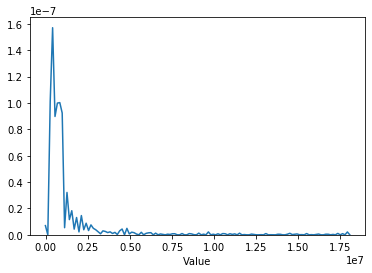

In [71]:
_ = sns.distplot(df_useful["GDP"]["Value"], rug=False, hist=False)

As we later want to train some Machine Learning models, we log those values so that their distribution look a bit **more like a normal distribution**.

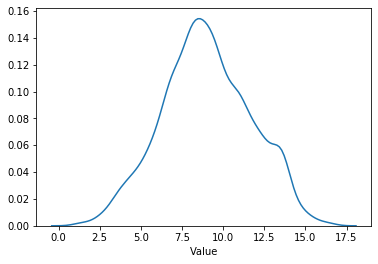

In [72]:
#looks better with log scale
_ = sns.distplot(np.log(df_useful["GDP"]["Value"]), rug=False, hist=False)

The new distribution indeed looks better to train models on it.

### 1.F. Making one uniformized dataframe  <a name="1F"></a>

In this part, we will make one **uniformized dataframe** `uni_df` with the following columns.


    Country | Year | GDP | Crops production columns | Livestock production columns | Crops importation columns | Livestock importation columns | Crops exportation columns | Livestock exportation columns | CPI
    
In this uniformized dataframe, **a tuple `(Country, Year)` uniquely identifies a row**.


#### 1.F.a. Pivoting dataframes with items  <a name="1Fa"></a>

The current dataframes have several rows for a given `(Country, Year)`. Each of this row correspond to one item. We would like to have a unique row for a given `(Country, Year)` and one column per item:

In [73]:
need_pivot = ['Crops Production',
              'Livestock production',
              'Live animals import quantities',
              'Live animals export quantities',
              'Food import quantities',
              'Food export quantities']

def rename_columns(x, word):
    if x not in ['Area', 'Year', 'ha', 'tonnes', 'hg/ha', 'Head', '1000 Head']:
        return x + ' ' + word
    return x

df_useful['GDP'] = df_useful['GDP'].rename(columns = {'Value':'(GDP, million $)'})[["Area",'Year','(GDP, million $)']]
df_useful['Consumer price indices'] = df_useful['Consumer price indices'].rename(columns = {'Value':'(Consumer price indices, %)'})[["Area",'Year','(Consumer price indices, %)']]

for df_name in need_pivot :
    df_useful[df_name] = pd.pivot_table(df_useful[df_name], index=["Area",'Year'], columns=["Item","Unit"], values="Value").rename(columns=lambda x: rename_columns(x, df_name))
    display(df_name, df_useful[df_name].sample(5))

'Crops Production'

,Item,"Anise, badian, fennel, coriander Crops Production",Apples Crops Production,Apricots Crops Production,Areca nuts Crops Production,Artichokes Crops Production,Asparagus Crops Production,Avocados Crops Production,Bambara beans Crops Production,Bananas Crops Production,Barley Crops Production,...,Sweet potatoes Crops Production,"Tangerines, mandarins, clementines, satsumas Crops Production",Taro (cocoyam) Crops Production,Tomatoes Crops Production,Tung nuts Crops Production,"Vegetables&Melons, Total Crops Production",Vetches Crops Production,Watermelons Crops Production,Wheat Crops Production,Yams Crops Production
,Unit,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,...,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes
Area,Year,,,,,,,,,,,,,,,,,,,,,
Ecuador,1984,11.0,29437.0,300.0,NaN,NaN,NaN,32577.0,NaN,1677571.0,24952.0,...,8295.0,31078.0,NaN,63980.0,NaN,320466.0,NaN,26669.0,25172.0,NaN
"China, Macao SAR",1981,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Mauritania,1962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,200.0,...,1900.0,NaN,NaN,NaN,NaN,3000.0,NaN,1000.0,100.0,1900.0
Sierra Leone,2005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,99927.0,NaN,2750.0,19000.0,NaN,264000.0,NaN,NaN,NaN,NaN
Sao Tome and Principe,1974,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1000.0,NaN,...,NaN,NaN,1000.0,NaN,NaN,1600.0,NaN,NaN,NaN,500.0


'Livestock production'

,Item,Animals live nes Livestock production,Asses Livestock production,Beehives Livestock production,Buffaloes Livestock production,"Camelids, other Livestock production",Camels Livestock production,Cattle Livestock production,Cattle and Buffaloes Livestock production,Chickens Livestock production,Ducks Livestock production,...,Horses Livestock production,Mules Livestock production,"Pigeons, other birds Livestock production",Pigs Livestock production,Poultry Birds Livestock production,Rabbits and hares Livestock production,"Rodents, other Livestock production",Sheep Livestock production,Sheep and Goats Livestock production,Turkeys Livestock production
,Unit,Head,Head,No Livestock production,Head,Head,Head,Head,Head,1000 Head,1000 Head,...,Head,Head,1000 Head,Head,1000 Head,1000 Head,1000 Head,Head,Head,1000 Head
Area,Year,,,,,,,,,,,,,,,,,,,,,
Belgium-Luxembourg,1995,NaN,NaN,28000.0,NaN,NaN,NaN,3369000.0,3369000.0,47400.0,110.0,...,66000.0,NaN,NaN,7053000.0,47794.0,180.0,NaN,161000.0,170000.0,272.0
Botswana,2010,NaN,338513.0,NaN,NaN,NaN,NaN,2648842.0,2648842.0,1761.0,NaN,...,41169.0,3000.0,NaN,3000.0,1761.0,120.0,NaN,279237.0,2217208.0,NaN
Equatorial Guinea,2003,NaN,NaN,NaN,NaN,NaN,NaN,5050.0,5050.0,320.0,30.0,...,NaN,NaN,NaN,6100.0,350.0,NaN,NaN,37600.0,46600.0,NaN
Luxembourg,2006,NaN,NaN,9923.0,NaN,NaN,NaN,183640.0,183640.0,81.0,NaN,...,4336.0,NaN,NaN,84151.0,81.0,7.0,NaN,9644.0,11594.0,NaN
Bulgaria,2001,NaN,196200.0,349452.0,7790.0,NaN,NaN,639778.0,647568.0,13000.0,1000.0,...,140311.0,13313.0,NaN,1143599.0,14950.0,418.0,NaN,2286400.0,3256674.0,700.0


'Live animals import quantities'

,Item,Animals live nes Live animals import quantities,Asses Live animals import quantities,Beehives Live animals import quantities,"Bovine, Animals Live animals import quantities",Buffaloes Live animals import quantities,"Camelids, other Live animals import quantities",Camels Live animals import quantities,Cattle Live animals import quantities,Chickens Live animals import quantities,Ducks Live animals import quantities,Goats Live animals import quantities,Horses Live animals import quantities,Mules Live animals import quantities,"Pigeons, other birds Live animals import quantities",Pigs Live animals import quantities,Rabbits and hares Live animals import quantities,"Rodents, other Live animals import quantities",Sheep Live animals import quantities,Sheep and Goats Live animals import quantities,Turkeys Live animals import quantities
,Unit,Head,Head,No Live animals import quantities,Head,Head,Head,Head,Head,1000 Head,1000 Head,Head,Head,Head,1000 Head,Head,1000 Head,1000 Head,Head,Head,1000 Head
Area,Year,,,,,,,,,,,,,,,,,,,,
Montenegro,1980,NaN,NaN,NaN,120000.0,NaN,NaN,NaN,120000.0,NaN,NaN,NaN,65000.0,NaN,NaN,415000.0,NaN,NaN,430000.0,430000.0,NaN
Sri Lanka,1975,NaN,NaN,0.0,6.0,NaN,NaN,NaN,6.0,19.0,0.0,0.0,0.0,NaN,NaN,13.0,NaN,NaN,0.0,0.0,NaN
Guam,1962,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Afghanistan,1984,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Myanmar,1966,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.0,0.0,NaN


'Live animals export quantities'

,Item,Animals live nes Live animals export quantities,Asses Live animals export quantities,Beehives Live animals export quantities,"Bovine, Animals Live animals export quantities",Buffaloes Live animals export quantities,"Camelids, other Live animals export quantities",Camels Live animals export quantities,Cattle Live animals export quantities,Chickens Live animals export quantities,Ducks Live animals export quantities,Goats Live animals export quantities,Horses Live animals export quantities,Mules Live animals export quantities,"Pigeons, other birds Live animals export quantities",Pigs Live animals export quantities,Rabbits and hares Live animals export quantities,"Rodents, other Live animals export quantities",Sheep Live animals export quantities,Sheep and Goats Live animals export quantities,Turkeys Live animals export quantities
,Unit,Head,Head,No Live animals export quantities,Head,Head,Head,Head,Head,1000 Head,1000 Head,Head,Head,Head,1000 Head,Head,1000 Head,1000 Head,Head,Head,1000 Head
Area,Year,,,,,,,,,,,,,,,,,,,,
Poland,1987,0.0,NaN,NaN,417811.0,NaN,NaN,NaN,417811.0,0.0,NaN,NaN,95749.0,NaN,NaN,0.0,0.0,NaN,751346.0,751346.0,NaN
Saint Kitts and Nevis,1977,NaN,NaN,NaN,132.0,NaN,NaN,NaN,132.0,NaN,NaN,84.0,0.0,NaN,NaN,21.0,NaN,NaN,119.0,203.0,NaN
Guam,2007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"China, Taiwan Province of",1964,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,48.0,NaN,0.0,0.0,NaN,0.0,9200.0,NaN,NaN,NaN,0.0,NaN
United Arab Emirates,1999,NaN,NaN,NaN,92.0,NaN,NaN,0.0,92.0,78.0,NaN,NaN,8.0,NaN,NaN,NaN,NaN,NaN,103600.0,103600.0,NaN


'Food import quantities'

,Item,Alfalfa meal and pellets Food import quantities,Almonds shelled Food import quantities,Animal Oil+Fat+Grs Food import quantities,Animal Vegetable Oil Food import quantities,Animal fats Food import quantities,"Anise, badian, fennel, coriander Food import quantities",Apples Food import quantities,Apricots Food import quantities,"Apricots, dry Food import quantities",Artichokes Food import quantities,...,"Wheat+Flour,Wheat Equivalent Food import quantities","Whey, Pres+Concen Food import quantities","Whey, condensed Food import quantities","Whey, dry Food import quantities",Wine Food import quantities,Wine+Vermouth+Sim. Food import quantities,"Wool, degreased Food import quantities","Wool, greasy Food import quantities","Wool, hair waste Food import quantities","Yoghurt, concentrated or not Food import quantities"
,Unit,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,...,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes
Area,Year,,,,,,,,,,,,,,,,,,,,,
South Africa,1993,NaN,417.0,52905.0,346103.0,52905.0,3155.0,0.0,0.0,76.0,NaN,...,1173048.0,2887.0,2275.0,612.0,697.0,710.0,1259.0,472.0,101.0,24.0
Grenada,1971,NaN,NaN,0.0,72.0,0.0,0.0,32.0,NaN,NaN,NaN,...,6938.0,0.0,NaN,0.0,105.0,121.0,NaN,NaN,NaN,NaN
Qatar,1995,NaN,247.0,50.0,12373.0,50.0,NaN,6486.0,NaN,NaN,NaN,...,54115.0,24.0,NaN,24.0,NaN,NaN,NaN,6.0,NaN,NaN
Portugal,1971,0.0,0.0,12949.0,51910.0,12949.0,124.0,1777.0,0.0,0.0,0.0,...,187655.0,0.0,0.0,0.0,167.0,175.0,1604.0,8290.0,547.0,0.0
Nepal,1989,NaN,NaN,1300.0,21306.0,1300.0,3000.0,100.0,NaN,NaN,NaN,...,6320.0,NaN,NaN,NaN,NaN,3.0,1486.0,1076.0,1.0,NaN


'Food export quantities'

,Item,Alfalfa meal and pellets Food export quantities,Almonds shelled Food export quantities,Animal Oil+Fat+Grs Food export quantities,Animal Vegetable Oil Food export quantities,Animal fats Food export quantities,"Anise, badian, fennel, coriander Food export quantities",Apples Food export quantities,Apricots Food export quantities,"Apricots, dry Food export quantities",Artichokes Food export quantities,...,"Wheat+Flour,Wheat Equivalent Food export quantities","Whey, Pres+Concen Food export quantities","Whey, condensed Food export quantities","Whey, dry Food export quantities",Wine Food export quantities,Wine+Vermouth+Sim. Food export quantities,"Wool, degreased Food export quantities","Wool, greasy Food export quantities","Wool, hair waste Food export quantities","Yoghurt, concentrated or not Food export quantities"
,Unit,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,...,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes,tonnes
Area,Year,,,,,,,,,,,,,,,,,,,,,
North Korea,1981,NaN,NaN,NaN,NaN,NaN,NaN,14000.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Bulgaria,1996,0.0,113.0,1829.0,27420.0,1829.0,7008.0,1391.0,306.0,131.0,0.0,...,776.0,0.0,NaN,0.0,180462.0,183470.0,186.0,77.0,325.0,13.0
Libya,1994,NaN,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.0,0.0,230.0,2200.0,NaN,NaN
Qatar,2000,30.0,2.0,652.0,1270.0,652.0,124.0,381.0,NaN,NaN,NaN,...,226.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN
Bermuda,1997,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Some **Nan values** have appeared. After some analysis, we have conclude to replace those Nan values by zeros. Indeed, it seems that those Nan values means that the value were very low and not significant to be measured.

In [74]:
# Deal with the NaN that appeared
for df_name in df_useful :
    if df_name != "GDP":
        for column in list(df_useful[df_name]):
            if column not in ['Area', 'Year']:
                df_useful[df_name][column].fillna(0, inplace=True)

In [75]:
#removing the multiindex, so that merge is clean with GDP and CPI
for df_name in need_pivot :
    df_useful[df_name].columns = [' '.join([str(_) for _ in v]) for v in df_useful[df_name].columns.values]
    display(df_useful[df_name].sample(5))
    

Anise, badian, fennel, coriander Crops Production tonnes  \
Area                  Year                                                             
Republic of the Congo 1974                                                0.0          
Jamaica               1995                                                0.0          
Germany               1981                                                0.0          
                      1986                                                0.0          
Montserrat            2006                                                0.0          

                            Apples Crops Production tonnes  \
Area                  Year                                   
Republic of the Congo 1974                             0.0   
Jamaica               1995                             0.0   
Germany               1981                       1285644.0   
                      1986                       2902106.0   
Montserrat            2006                             0.0   

                            Apricots Crops Production tonnes  \
Area                  Year                                     
Republic of the Congo 1974                               0.0   
Jamaica               1995                               0.0   
Germany               1981                            1298.0   
                      1986                            2046.0   
Montserrat            2006                               0.0   

                            Areca nuts Crops Production tonnes  \
Area                  Year                                       
Republic of the Congo 1974                                 0.0   
Jamaica               1995                                 0.0   
Germany               1981                                 0.0   
                      1986                                 0.0   
Montserrat            2006                                 0.0   

                            Artichokes Crops Production tonnes  \
Area                  Year                                       
Republic of the Congo 1974                                 0.0   
Jamaica               1995                                 0.0   
Germany               1981                                 0.0   
                      1986                                 0.0   
Montserrat            2006                                 0.0   

                            Asparagus Crops Production tonnes  \
Area                  Year                                      
Republic of the Congo 1974                                0.0   
Jamaica               1995                                0.0   
Germany               1981                            15541.0   
                      1986                            18561.0   
Montserrat            2006                                0.0   

                            Avocados Crops Production tonnes  \
Area                  Year                                     
Republic of the Congo 1974                            6200.0   
Jamaica               1995                            3618.0   
Germany               1981                               0.0   
                      1986                               0.0   
Montserrat            2006                               0.0   

                            Bambara beans Crops Production tonnes  \
Area                  Year                                          
Republic of the Congo 1974                                    0.0   
Jamaica               1995                                    0.0   
Germany               1981                                    0.0   
                      1986                                    0.0   
Montserrat            2006                                    0.0   

                            Bananas Crops Production tonnes  \
Area                  Year                                    
Republic of the Congo 1974                          20126.0   
Jamaica               1

,,Animals live nes Livestock production Head,Asses Livestock production Head,Beehives Livestock production No Livestock production,Buffaloes Livestock production Head,"Camelids, other Livestock production Head",Camels Livestock production Head,Cattle Livestock production Head,Cattle and Buffaloes Livestock production Head,Chickens Livestock production 1000 Head,Ducks Livestock production 1000 Head,...,Horses Livestock production Head,Mules Livestock production Head,"Pigeons, other birds Livestock production 1000 Head",Pigs Livestock production Head,Poultry Birds Livestock production 1000 Head,Rabbits and hares Livestock production 1000 Head,"Rodents, other Livestock production 1000 Head",Sheep Livestock production Head,Sheep and Goats Livestock production Head,Turkeys Livestock production 1000 Head
Area,Year,,,,,,,,,,,,,,,,,,,,,
Grenada,1969,0.0,1800.0,0.0,0.0,0.0,0.0,6000.0,6000.0,200.0,0.0,...,12.0,70.0,0.0,2900.0,200.0,0.0,0.0,10000.0,16000.0,0.0
Uzbekistan,1961,0.0,804000.0,10250000.0,389000.0,0.0,283600.0,75780000.0,76169000.0,448000.0,0.0,...,9900000.0,4300.0,0.0,58674000.0,516000.0,9000.0,0.0,133014000.0,140304000.0,68000.0
Ireland,2004,0.0,5100.0,0.0,0.0,0.0,0.0,7015600.0,7015600.0,12500.0,190.0,...,72800.0,600.0,0.0,1653100.0,14395.0,0.0,0.0,6777200.0,6784700.0,1650.0
"China, Macao SAR",1984,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,400.0,0.0,...,0.0,0.0,0.0,0.0,400.0,0.0,0.0,0.0,0.0,0.0
Saint Pierre and Miquelon,1973,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,,Animals live nes Live animals import quantities Head,Asses Live animals import quantities Head,Beehives Live animals import quantities No Live animals import quantities,"Bovine, Animals Live animals import quantities Head",Buffaloes Live animals import quantities Head,"Camelids, other Live animals import quantities Head",Camels Live animals import quantities Head,Cattle Live animals import quantities Head,Chickens Live animals import quantities 1000 Head,Ducks Live animals import quantities 1000 Head,Goats Live animals import quantities Head,Horses Live animals import quantities Head,Mules Live animals import quantities Head,"Pigeons, other birds Live animals import quantities 1000 Head",Pigs Live animals import quantities Head,Rabbits and hares Live animals import quantities 1000 Head,"Rodents, other Live animals import quantities 1000 Head",Sheep Live animals import quantities Head,Sheep and Goats Live animals import quantities Head,Turkeys Live animals import quantities 1000 Head
Area,Year,,,,,,,,,,,,,,,,,,,,
Italy,2004,0.0,4422.0,0.0,1468059.0,0.0,0.0,0.0,1468059.0,9310.0,98.0,14922.0,95450.0,64.0,0.0,790593.0,35.0,0.0,1715426.0,1730348.0,2920.0
Kiribati,2002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Iraq,1972,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1094.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Greece,1976,0.0,0.0,0.0,27677.0,0.0,0.0,0.0,27677.0,953.0,0.0,0.0,16.0,0.0,0.0,14739.0,0.0,0.0,32.0,32.0,0.0
Azerbaijan,1985,0.0,0.0,0.0,120000.0,0.0,0.0,0.0,120000.0,0.0,0.0,0.0,60000.0,0.0,0.0,430000.0,0.0,0.0,312000.0,312000.0,0.0


,,Animals live nes Live animals export quantities Head,Asses Live animals export quantities Head,Beehives Live animals export quantities No Live animals export quantities,"Bovine, Animals Live animals export quantities Head",Buffaloes Live animals export quantities Head,"Camelids, other Live animals export quantities Head",Camels Live animals export quantities Head,Cattle Live animals export quantities Head,Chickens Live animals export quantities 1000 Head,Ducks Live animals export quantities 1000 Head,Goats Live animals export quantities Head,Horses Live animals export quantities Head,Mules Live animals export quantities Head,"Pigeons, other birds Live animals export quantities 1000 Head",Pigs Live animals export quantities Head,Rabbits and hares Live animals export quantities 1000 Head,"Rodents, other Live animals export quantities 1000 Head",Sheep Live animals export quantities Head,Sheep and Goats Live animals export quantities Head,Turkeys Live animals export quantities 1000 Head
Area,Year,,,,,,,,,,,,,,,,,,,,
Venezuela,1987,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,340.0,0.0,0.0,0.0,0.0,0.0
Bosnia and Herzegovina,1961,0.0,805.0,0.0,150231.0,611.0,0.0,0.0,149620.0,7.0,0.0,0.0,64737.0,210.0,4.0,7565.0,0.0,0.0,649160.0,649160.0,31.0
Bangladesh,2004,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Iran,1968,0.0,0.0,0.0,3466.0,0.0,0.0,694.0,3466.0,15.0,0.0,27134.0,0.0,0.0,0.0,0.0,0.0,0.0,13821.0,40955.0,0.0
"China, Hong Kong SAR",1966,0.0,0.0,0.0,2100.0,0.0,0.0,0.0,2100.0,120.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,,Alfalfa meal and pellets Food import quantities tonnes,Almonds shelled Food import quantities tonnes,Animal Oil+Fat+Grs Food import quantities tonnes,Animal Vegetable Oil Food import quantities tonnes,Animal fats Food import quantities tonnes,"Anise, badian, fennel, coriander Food import quantities tonnes",Apples Food import quantities tonnes,Apricots Food import quantities tonnes,"Apricots, dry Food import quantities tonnes",Artichokes Food import quantities tonnes,...,"Wheat+Flour,Wheat Equivalent Food import quantities tonnes","Whey, Pres+Concen Food import quantities tonnes","Whey, condensed Food import quantities tonnes","Whey, dry Food import quantities tonnes",Wine Food import quantities tonnes,Wine+Vermouth+Sim. Food import quantities tonnes,"Wool, degreased Food import quantities tonnes","Wool, greasy Food import quantities tonnes","Wool, hair waste Food import quantities tonnes","Yoghurt, concentrated or not Food import quantities tonnes"
Area,Year,,,,,,,,,,,,,,,,,,,,,
South Africa,2005,0.0,1074.0,23623.0,705125.0,23623.0,4480.0,0.0,0.0,239.0,0.0,...,1279704.0,8085.0,0.0,8085.0,10458.0,10734.0,1792.0,132.0,155.0,21.0
Curaçao,1987,0.0,0.0,0.0,630.0,0.0,0.0,1375.0,0.0,0.0,0.0,...,17163.0,0.0,0.0,0.0,755.0,783.0,0.0,0.0,0.0,0.0
Brazil,1963,0.0,0.0,2527.0,12229.0,2527.0,922.0,64290.0,0.0,0.0,0.0,...,2186494.0,0.0,0.0,0.0,668.0,680.0,130.0,3050.0,0.0,0.0
Turkmenistan,2006,0.0,0.0,0.0,5257.0,0.0,0.0,15751.0,0.0,0.0,0.0,...,22765.0,0.0,0.0,0.0,504.0,504.0,0.0,0.0,0.0,0.0
Romania,2009,1464.0,543.0,30322.0,206710.0,30322.0,353.0,31937.0,1095.0,204.0,7.0,...,738963.0,6132.0,0.0,6132.0,12642.0,13677.0,1210.0,339.0,8.0,8456.0


,,Alfalfa meal and pellets Food export quantities tonnes,Almonds shelled Food export quantities tonnes,Animal Oil+Fat+Grs Food export quantities tonnes,Animal Vegetable Oil Food export quantities tonnes,Animal fats Food export quantities tonnes,"Anise, badian, fennel, coriander Food export quantities tonnes",Apples Food export quantities tonnes,Apricots Food export quantities tonnes,"Apricots, dry Food export quantities tonnes",Artichokes Food export quantities tonnes,...,"Wheat+Flour,Wheat Equivalent Food export quantities tonnes","Whey, Pres+Concen Food export quantities tonnes","Whey, condensed Food export quantities tonnes","Whey, dry Food export quantities tonnes",Wine Food export quantities tonnes,Wine+Vermouth+Sim. Food export quantities tonnes,"Wool, degreased Food export quantities tonnes","Wool, greasy Food export quantities tonnes","Wool, hair waste Food export quantities tonnes","Yoghurt, concentrated or not Food export quantities tonnes"
Area,Year,,,,,,,,,,,,,,,,,,,,,
Singapore,2010,15.0,556.0,2626.0,393374.0,2626.0,3917.0,6983.0,14.0,37.0,0.0,...,78503.0,1140.0,0.0,1140.0,11804.0,12078.0,36.0,6.0,0.0,468.0
Sri Lanka,2003,0.0,0.0,0.0,8052.0,0.0,21.0,9.0,0.0,0.0,0.0,...,5974.0,0.0,0.0,0.0,22.0,27.0,0.0,0.0,0.0,8.0
Aruba,1975,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Malaysia,2012,10.0,303.0,50.0,20370364.0,50.0,834.0,1930.0,0.0,0.0,0.0,...,82210.0,1009.0,0.0,1009.0,2308.0,2555.0,24.0,0.0,376.0,3225.0
Fiji,1976,0.0,0.0,1.0,14207.0,1.0,2.0,3.0,0.0,0.0,0.0,...,78.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0


#### 1.F.b. Dealing with unit discrepencies  <a name="1Fb"></a>
Before merging dataframes, we notice two different units in the dataframes dealing with livestock datas: "1000 Heads" and "Heads". Let's have a look at the following dataframes:
* Livestock production
* Live animals import quantities
* Live animals export quantities


In [76]:
#Select dfs that correspond to livestock data
livestock_dfs={s:df_useful[s] for s in df_useful.keys() if 'live' in s.lower()}

Before handling the data, we want to know if the columns presented in "1000 Heads" are also presented in "Heads"

In [77]:
# Useful method to remove words from string
def drop_words( s , w=1 , end=True):
    if end:
        return s.rsplit(' ',w)[0]
    else:
        return s.split(' ',w)[-1]
    

for key in livestock_dfs.keys():
    col=livestock_dfs[key].columns
    th_heads=[s for s in col if '1000 head' in s.lower()]
    heads=[s for s in col if '1000 head' not in s.lower()]
    shared=[s for s in th_heads if drop_words(s,2)+" Head" in heads]
    print('There are {} columns expressed in "1000 Heads" and {} columns expressed in "Head" in the dataframe {} and {} columns are expressed in both'
          .format(len(th_heads),len(heads),key,len(shared)))
    

There are 8 columns expressed in "1000 Heads" and 14 columns expressed in "Head" in the dataframe Livestock production and 0 columns are expressed in both
There are 6 columns expressed in "1000 Heads" and 14 columns expressed in "Head" in the dataframe Live animals import quantities and 0 columns are expressed in both
There are 6 columns expressed in "1000 Heads" and 14 columns expressed in "Head" in the dataframe Live animals export quantities and 0 columns are expressed in both


In [78]:
def convert_1000H_to_head(df):
    
    # methods converting the columns expressed in "1000 Head" in "Head" and renaming them
    
    cols_to_convert=[col for col in df.columns if '1000 head' in col.lower()]
    df[cols_to_convert]=df[cols_to_convert]*1000
    new_cols=[drop_words(s,2)+' Head' for s in cols_to_convert]
    name_dic={old:new for old,new in zip(cols_to_convert,new_cols)}
    df=df.rename(columns=name_dic)
    return df

In [79]:
for key in livestock_dfs.keys():
    df_useful[key]=convert_1000H_to_head(df_useful[key])
    display(df_useful[key].head(1))

,,Animals live nes Livestock production Head,Asses Livestock production Head,Beehives Livestock production No Livestock production,Buffaloes Livestock production Head,"Camelids, other Livestock production Head",Camels Livestock production Head,Cattle Livestock production Head,Cattle and Buffaloes Livestock production Head,Chickens Livestock production Head,Ducks Livestock production Head,...,Horses Livestock production Head,Mules Livestock production Head,"Pigeons, other birds Livestock production Head",Pigs Livestock production Head,Poultry Birds Livestock production Head,Rabbits and hares Livestock production Head,"Rodents, other Livestock production Head",Sheep Livestock production Head,Sheep and Goats Livestock production Head,Turkeys Livestock production Head
Area,Year,,,,,,,,,,,,,,,,,,,,,
Afghanistan,1961,0.0,1300000.0,0.0,0.0,0.0,250000.0,2900000.0,2900000.0,4700000.0,0.0,...,276841.0,20000.0,0.0,0.0,4700000.0,0.0,0.0,18000000.0,22200000.0,0.0


,,Animals live nes Live animals import quantities Head,Asses Live animals import quantities Head,Beehives Live animals import quantities No Live animals import quantities,"Bovine, Animals Live animals import quantities Head",Buffaloes Live animals import quantities Head,"Camelids, other Live animals import quantities Head",Camels Live animals import quantities Head,Cattle Live animals import quantities Head,Chickens Live animals import quantities Head,Ducks Live animals import quantities Head,Goats Live animals import quantities Head,Horses Live animals import quantities Head,Mules Live animals import quantities Head,"Pigeons, other birds Live animals import quantities Head",Pigs Live animals import quantities Head,Rabbits and hares Live animals import quantities Head,"Rodents, other Live animals import quantities Head",Sheep Live animals import quantities Head,Sheep and Goats Live animals import quantities Head,Turkeys Live animals import quantities Head
Area,Year,,,,,,,,,,,,,,,,,,,,
Afghanistan,1961,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,,Animals live nes Live animals export quantities Head,Asses Live animals export quantities Head,Beehives Live animals export quantities No Live animals export quantities,"Bovine, Animals Live animals export quantities Head",Buffaloes Live animals export quantities Head,"Camelids, other Live animals export quantities Head",Camels Live animals export quantities Head,Cattle Live animals export quantities Head,Chickens Live animals export quantities Head,Ducks Live animals export quantities Head,Goats Live animals export quantities Head,Horses Live animals export quantities Head,Mules Live animals export quantities Head,"Pigeons, other birds Live animals export quantities Head",Pigs Live animals export quantities Head,Rabbits and hares Live animals export quantities Head,"Rodents, other Live animals export quantities Head",Sheep Live animals export quantities Head,Sheep and Goats Live animals export quantities Head,Turkeys Live animals export quantities Head
Area,Year,,,,,,,,,,,,,,,,,,,,
Afghanistan,1961,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


#### 1.F.c. Merging everything  <a name="1Fc"></a>
We are now creating the uniformized dataframe `uni_df`. Each row corresponds to one tuple `(Country, Year)` so that we can later **group by country** or **year**. In addition to the country ("Area") and the "Year", the columns will either be an **economic feature ("GDP", "CPI")** or an **agricultural one (some crop harvested area, some livestock export quantity, ...)**. With this uniformized dataframe, we can later on **analyze correlations and links** between different feautures place and yearwise. This means we can measure a correlation of e.g. GDP with the production of a specific crop over all countries and all years.

In [80]:
uni_df = df_useful['GDP'].dropna()
for df_name in need_pivot :
    uni_df = pd.merge(uni_df, df_useful[df_name], how='left', on=['Area', 'Year'])
uni_df = pd.merge(uni_df,df_useful['Consumer price indices'], how='left', on=['Area', 'Year'])

# Deal with the NaN that appeared
for column in list(uni_df):
    if column not in ['Area', 'Year']:
        uni_df[column].fillna(0, inplace=True)
uni_df.sample(30)

,Area,Year,"(GDP, million $)","Anise, badian, fennel, coriander Crops Production tonnes",Apples Crops Production tonnes,Apricots Crops Production tonnes,Areca nuts Crops Production tonnes,Artichokes Crops Production tonnes,Asparagus Crops Production tonnes,Avocados Crops Production tonnes,...,"Whey, Pres+Concen Food export quantities tonnes","Whey, condensed Food export quantities tonnes","Whey, dry Food export quantities tonnes",Wine Food export quantities tonnes,Wine+Vermouth+Sim. Food export quantities tonnes,"Wool, degreased Food export quantities tonnes","Wool, greasy Food export quantities tonnes","Wool, hair waste Food export quantities tonnes","Yoghurt, concentrated or not Food export quantities tonnes","(Consumer price indices, %)"
2314,Cyprus,2011,2.742887e+04,0.0,7121.0,924.0,0.0,2557.0,0.0,1059.0,...,0.0,0.0,0.0,1963.0,1974.0,0.0,100.0,0.0,0.0,3.677450
1626,Central African Republic,1974,4.106469e+02,0.0,0.0,0.0,0.0,0.0,0.0,500.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
6420,Palau,1978,2.117632e+01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
1815,"China, Macao SAR",1979,8.433325e+02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
6310,Occupied Palestinian Territory,2006,4.910100e+03,1652.0,1063.0,1067.0,0.0,0.0,0.0,376.0,...,0.0,0.0,0.0,34.0,34.0,0.0,0.0,0.0,0.0,4.905146
8470,Trinidad and Tobago,2004,1.328030e+04,0.0,0.0,0.0,0.0,0.0,0.0,430.0,...,0.0,0.0,0.0,6.0,6.0,0.0,0.0,0.0,4.0,9.645460
8759,Ukraine,2011,1.693338e+05,13000.0,954100.0,119900.0,0.0,0.0,0.0,0.0,...,23157.0,0.0,23157.0,39986.0,40167.0,22.0,83.0,0.0,2630.0,7.171897
6397,Pakistan,2001,7.326881e+04,0.0,367125.0,124675.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,850.0,0.0,50.0,0.0,3.148262
2004,Republic of the Congo,1979,1.194373e+03,0.0,0.0,0.0,0.0,0.0,0.0,6000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
9001,Latvia,1970,4.334125e+05,0.0,5046000.0,257000.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,23000.0,23000.0,17700.0,0.0,0.0,0.0,0.000000


#### 1.G The last filter  <a name="1G"></a>

At the very beginning, when importing data for the crops production, we focused on the "food crops". It is very likely that the import and export dataframes contain more data than we have in the production dataframe. As we want, later, compare these data, we decide to keep only the crops and animals for which we have production,import and export data.  

Let's have a look!

In [81]:
import_cols=[col for col in uni_df.columns if 'import' in col.lower()]
export_cols=[col for col in uni_df.columns if 'export' in col.lower()]
prod_cols=[col for col in uni_df.columns if 'production' in col.lower()]
others=[col for col in uni_df.columns if 'production' not in col.lower() and 'export' not in col.lower() and 'import' not in col.lower()]
print('There are {} import columns, {} export columns,{} production columns and {} other.'.format(len(import_cols),len(export_cols),len(prod_cols),len(others)))

There are 472 import columns, 464 export columns,144 production columns and 4 other.


There is indeed much work to be done!

In [82]:
import_col_dic={drop_words(s,3):s for s in import_cols}
export_col_dic={drop_words(s,3):s for s in export_cols}
prod_col_dic={drop_words(s,3):s for s in prod_cols}

import_keys=list(import_col_dic.keys())
export_keys=list(export_col_dic.keys())
prod_keys=list(prod_col_dic.keys())

prod=set([])
imp=set([])
exp=set([])

for prod_feature in prod_keys:
    for imp_feature in import_keys:
        if prod_feature.lower()+" food" == imp_feature.lower() or prod_feature.lower()+" live animals" == imp_feature.lower():
            for exp_feature in export_keys:
                if prod_feature.lower()+" food" == exp_feature.lower() or prod_feature.lower()+" live animals" == exp_feature.lower():
                    prod.add(prod_feature)
                    imp.add(imp_feature)
                    exp.add(exp_feature)
prod=list(prod)
prod.sort()
exp=list(exp)
exp.sort()
imp=list(imp)
imp.sort()

print('We find {} columns present in import, export and production'.format(len(prod)))

import_cols=[import_col_dic[k] for k in imp]
export_cols=[export_col_dic[k] for k in exp]
prod_cols=[prod_col_dic[k] for k in prod]

cols_of_interest=others+import_cols+export_cols+prod_cols

We find 107 columns present in import, export and production


In [83]:
uni_df=uni_df[cols_of_interest]

In [84]:
import pickle
pickle.dump(uni_df,open("Scripts/Data/uni_df.pkl",'wb'))

### 2. Data exploration and first observations  <a name="2"></a>

2. 
        
    1. [Food productions, importations and exportations](#2A)
            
    2. [Consumer price indices](#2B)      
                
    3. [Structure of international trade and historical context](#2C)       
        
    4. [Economic classification of countries](#2D)  
        
In this part, we will explore the dataset with more details. We will first see in more detail the [food productions, importations and exportations](#2A), next examine the [Consumer price indices](#2B), then study the [structure of international trade and historical context](#2C) and finally look at the [economic classification of countries](#2D).

#### 2.A. Food productions, importations and exportations <a name="2A"></a>

2. 
        
    1. 
    
        1. [Crops and livestock production and trade](#2Aa)  
    
        2. [Introducing the concept of food self-sufficiency](#2Ab)
    
            1. [Basic idea](#2Abi)
    
            2. [Formula and computation](#2Abii)

##### 2.A.a Crops and livestock production and trade <a name="2Aa"></a>
For the next milestone, we will also produce some maps, showing for instance the production of a specific crop per country over the years. We have shown in previous parts that the dataset contains the necessary data and that we can handle the data in its size and plot maps.

##### 2.A.b Introducing the concept of food self-sufficiency <a name="2Ab"></a>
In this section we will present and compute the **notion of food self-sufficiency**. We will use the **quantitative definition of the Food and Agriculture Organization (FAO)**. 
###### 2.A.b.i Basic idea <a name="2Abi"></a>
One may wonder how to know **whether a country produces all the food it needs or not**. The notion of food-self-sufficency allows to answer to this question. More formally, it is a rate that decribes how **to which degree a country can satisfy to meet its internal consumption needs by production**. It describes the extent to which a country is able to **feed its population through its domestic food production**. We are interested in this measure since we think**it could be correlated** with the economic conditions of this country, particularly **price stability**. Price stability is defined in the next part.
###### 2.A.b.ii Formula and computation <a name="2Abii"></a>
In order to compute the food self-sufficiency, we will apply the following **formula** that gives us the **food self-sudfficiency as a percentage** :

$$\frac{Production \times 100}{Production + Imports – Exports}$$

The following is a trial calculation of self-sufficiency. Refining which agriculutral products should go into this calculation still need to be done for next milestone. Indeed with our first calculations it seems that the self-sufficiency is always lower than 100% whereas this should not be the case.

In [85]:
def compute_self_suficiency(df,w=None):
    
    # From the unified dataframe df, compute the self sufficiency score for each year for each country
    # if a paramter of weights is given as a dict, the method returns the aggregated score.
    
    weights=w.copy()
    
    #Useful method to manipulate names
    def drop_words( s , w=1 , end=True):
        if end:
            return s.rsplit(' ',w)[0]
        else:
            return s.split(' ',w)[-1]
    
    df=df.set_index(['Area','Year'])
    
    #Getting the columns corresponding to import, export and production
    import_cols=[col for col in df.columns if 'import' in col.lower()]
    export_cols=[col for col in df.columns if 'export' in col.lower()]
    prod_cols=[col for col in df.columns if 'production' in col.lower()]
    
    #Initializing new dataframe
    scores=pd.DataFrame(index=df.index)
    
    #Generating scores
    for i,col in enumerate(import_cols):
        scores[drop_words(col,3)]=(df[prod_cols[i]]*100/(
                                    df[prod_cols[i]]+df[import_cols[i]]-df[export_cols[i]]))
    
    #If no weights, return scores without aggregate
    if weights==None:
        return scores
    
    features=[w for w in weights.keys()]
    temp=pd.DataFrame(index=df.index)
    
    #replacing na with 0 to avoid na aggregated scores
    scores=scores.fillna(0)
    
    #Selecting features of interest and multiplying them with their weight
    #Note: Some weights refer to the same score (eg 'Maize Crops Production tonnes' and 'Maize Food import quantities tonnes') to go around this problem, the scores referring to the same columns are sumed
    
    temp_dic={}#Will retain data untill complete and then turned into pandas DataFrame
    popped=[] #Will store the weights that are already taken care of because they reffered to the same columns as another weight already treated
    for feat in list(weights.keys()):
        if feat not in popped:
            w_agg={feat:weights[feat]}
            s=re.split(' Food| Live.*| Crops',feat)[0]
            s='^'+s
            w=weights[feat]

            for f in list(weights.keys()):
                if f!=feat and re.search(s,f) and s[1:]==re.split(' Food.*| Live.*| Crops.*',f)[0]:
                    w+=weights[f]
                    w_agg.update({f:weights[f]})
                    popped.append(f)
    
            if len(scores.filter(regex=s).columns)==0:
                print('\n {} NOT FOUND'.format(feat))
            else:
                print('{} weight : {} agg from: {}'.format(feat,w,w_agg))
                temp_df=scores.filter(regex=s).copy()
                temp_df=temp_df.apply(lambda x: x*w)
                temp_dic.update(temp_df.to_dict())
            
    temp=pd.DataFrame(temp_dic)
    #Aggregating the scores
    scores=pd.DataFrame(temp.sum(axis=1),columns=['Agg'])
    
    return scores

#### 2.B. Consumer price indices  <a name="2B"></a>

2. 
        
    2. 
    
        1. [Definition](#2Ba) 
    
        2. [Usage](#2Bb)      
        
##### 2.B.a. Definition  <a name="2Ba"></a>

**Consumer price indices (CPI)** are a way to measure the **changes of the average price level of goods**.
Typically a "basket of consumer goods and services" is used to calculate average consumer prices each year. Then, the relative change of these prices is used as a **measure of inflation or deflation over a period of time**. More technically, for a given item, the CPI is the ratio of the market basket for two different years. Global CPI is an average of sigle item CPI with **some standardized weights**. 
The FAO dataset includes the consumer prices, food indices. This means we have **information about countries food price stability over the years**.

##### 2.B.b. Usage  <a name="2Bb"></a>

The CPI has **many uses** and is often taken into consideration. For instance it is used for budget and pension revisions, monetary and economic policies, and economic analysis. It is a good indicator of relative price stability, which is essential for development and economic safety. The european central banks main objective is price stability in the euro-zone of keeping the consumer price index below a growth of 2% per year.  

**We will use the CPI** to answer the following questions: "Are prices more stables in more self-sufficient countries ?", "Is there a link between the CPI and other agricultural features ?" 

#### 2.C. Structure of international trade and historical context  <a name="2C"></a>


Our dataset contains data for the historical period **from 1970 to 2015**. In order to be able to correctly interpret the results we are going to see, we first made **a brief historical research** on this period. Listed below are important events of this period for which we think they have had a **significant influence on the agriculture and the economy**.

There was the Cold war from 1945 to 1990 with two economic superpowers (USA and USSR). The USSR had been dissolved in 1991.  The Japanese economic miracle occured from 1945 to 1990 and allowed Japan to come out of the disastrous state in which it was at the exit of the WW2 and become one of the worlds largest economies. There have been 2 big oil crises, in 1973 and 1979. There have been many wars (Middle East wars 1973-2000 e.g. Yom Kippur War 1973, Islamic Revolution in Iran 1979, Iran–Iraq war 1980-1988, Gulf war 1990-1991, Yugoslav wars 1991-2001...). We have **already seen some consequences of such events** by dealing with countries names in a previous section.

The **third Agricultural Revolution** (also known as Green revolution) occurs form 1960 to 1990 and improved agricultural productions thanks to fertilizers and chemicals.

The following public-domain image from [Wikimedia](https://commons.wikimedia.org/wiki/File:Imf-advanced-un-least-developed-2008.svg) represents developed countries (blue), developing ones (orange) and least developed ones (red) according to the United Nations and International Monetary Fund. We expect to see **similar results with our dataset (GDP)**.
<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/1/15/Imf-advanced-un-least-developed-2008.svg/1920px-Imf-advanced-un-least-developed-2008.svg.png">

The following image, also from [Wikimedia](https://commons.wikimedia.org/wiki/File:Cumulative_Current_Account_Balance.png) shows the **cumulative commercial balance** for the period 1980-2008. We also expect to see similar results with our dataset, but **there might be difference as we focus on agriculture**.
<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/3/32/Cumulative_Current_Account_Balance.png/800px-Cumulative_Current_Account_Balance.png">


In order to have an idea of the **international trade and economy structure**, we are interested in **GDP**: 

In [86]:
pivoted_GDP_df = uni_df[['Area','Year']]
pivoted_GDP_df["GDP"] = uni_df["(GDP, million $)"]
pivoted_GDP_df = pivoted_GDP_df.pivot_table(index='Year', columns='Area', values="GDP").dropna(axis=1)

C:\Users\Martin\.conda\envs\ada\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [87]:
pivoted_GDP_df.sample(5)

Area,Afghanistan,Albania,Algeria,Andorra,Angola,Anguilla,Antigua and Barbuda,Argentina,Armenia,Aruba,...,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,
1978,3300.000103,2842.275926,26373.761387,389.745929,4845.481650,9.103205,91.503578,63864.821776,840138.635670,267.613551,...,7583.729334,2356600.0,5377.141229,840138.635670,99.159938,45987.492791,6531.932617,271.074238,3098.138218,4685.672360
2006,7514.261673,8896.076004,117027.277940,3543.075303,52384.484190,284.262963,1149.025498,235423.738140,6808.524718,2424.581006,...,18823.844159,13855888.0,19579.486729,17378.238640,439.376662,183477.410340,66371.664817,22812.476328,12756.947254,6101.630000
1977,2953.333408,2760.746397,20990.939140,321.390137,4344.224915,7.889455,80.823635,61662.169716,738416.534350,254.069572,...,6331.676856,2086000.0,4487.941894,738416.534350,81.253725,42354.954186,5413.318416,224.670559,2767.425574,4683.467683
1991,3340.100005,1597.072192,46565.003199,1400.576915,16182.941825,77.720091,481.706342,205589.521320,2104.061784,872.138731,...,7911.679877,6174000.0,11095.737334,15157.816895,204.237673,51726.320757,7642.396514,4183.404717,3376.806697,10952.089847
1974,2155.555500,2537.015817,13259.764650,236.055468,5626.960764,6.749690,83.529500,47637.003239,616593.066090,217.413403,...,4250.864346,1548800.0,4334.170819,616593.066090,66.380251,30529.754419,3604.730807,137.848423,2894.548228,4274.461006


As we can see on a subset of the correlation matrix below, GDP are often hugely correlated between countries. 

In [88]:
selected_countries = ['Algeria', 'Australia', 'Austria', 'Bangladesh', 'China',
                      'Djibouti', 'France', 'Germany', 'India', 'Japan', 'Mali',
                      'Switzerland', 'United States of America']

corr = pivoted_GDP_df[selected_countries].corr()
corr.style.background_gradient(cmap='coolwarm')

Area,Algeria,Australia,Austria,Bangladesh,China,Djibouti,France,Germany,India,Japan,Mali,Switzerland,United States of America
Area,,,,,,,,,,,,,
Algeria,1,0.976574,0.907284,0.933577,0.929756,0.944831,0.900182,0.869324,0.968863,0.709052,0.97585,0.940471,0.894591
Australia,0.976574,1,0.942796,0.951553,0.940319,0.949289,0.932475,0.911348,0.983419,0.772262,0.988519,0.971698,0.929846
Austria,0.907284,0.942796,1,0.893578,0.826997,0.918576,0.998487,0.994014,0.904309,0.904562,0.936305,0.983805,0.977718
Bangladesh,0.933577,0.951553,0.893578,1,0.982876,0.988926,0.875213,0.865189,0.984286,0.70948,0.976807,0.946768,0.913102
China,0.929756,0.940319,0.826997,0.982876,1,0.955692,0.80428,0.78567,0.980841,0.601672,0.963651,0.898221,0.842533
Djibouti,0.944831,0.949289,0.918576,0.988926,0.955692,1,0.905293,0.898016,0.971203,0.764799,0.972581,0.963414,0.937559
France,0.900182,0.932475,0.998487,0.875213,0.80428,0.905293,1,0.993633,0.888926,0.907598,0.924552,0.976428,0.973908
Germany,0.869324,0.911348,0.994014,0.865189,0.78567,0.898016,0.993633,1,0.86628,0.936339,0.904118,0.973805,0.967602
India,0.968863,0.983419,0.904309,0.984286,0.980841,0.971203,0.888926,0.86628,1,0.700805,0.992389,0.951396,0.909


The correlation matrix contains lots of values that are very closed to one (red). This is also true for the whole correlation matrix as seen below:

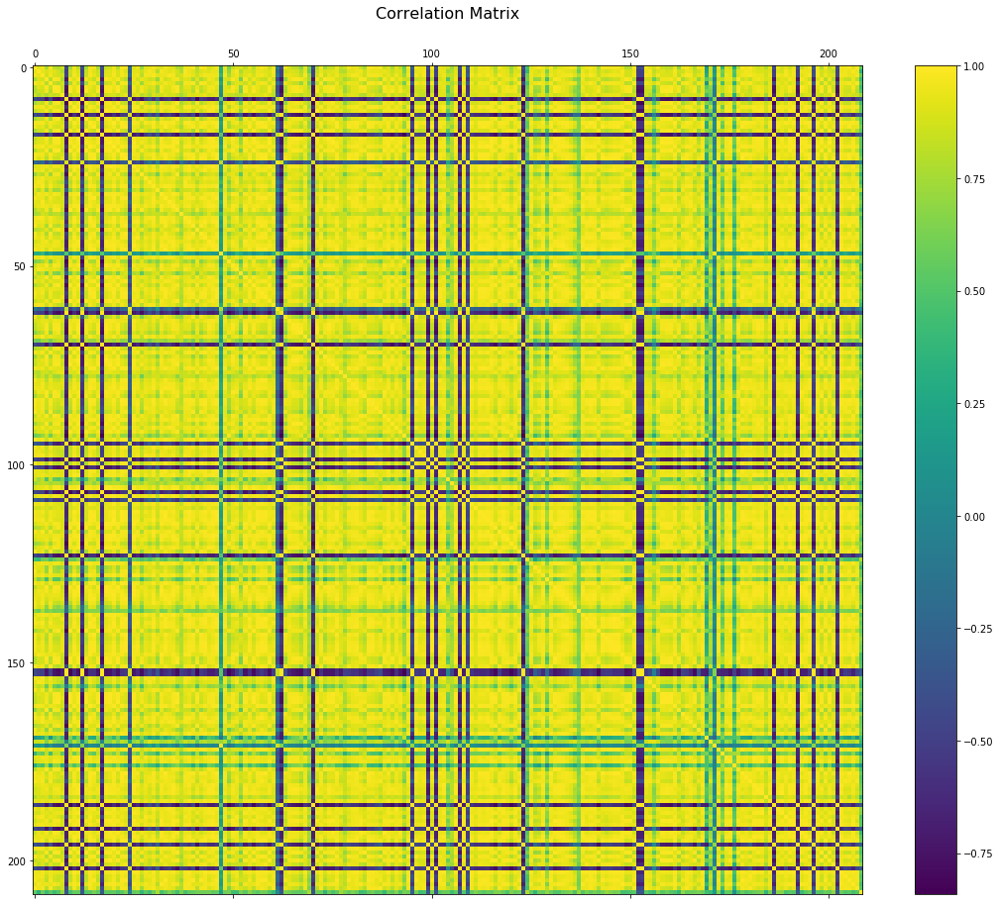

In [89]:
f = plt.figure(figsize=(19, 15))
plt.matshow(pivoted_GDP_df.corr(), fignum=f.number)
cb = plt.colorbar()
cb.ax.tick_params()
plt.title('Correlation Matrix', fontsize=16);

We then try to clusterize this correlation matrix in order to find countries whose GDP are correlated:

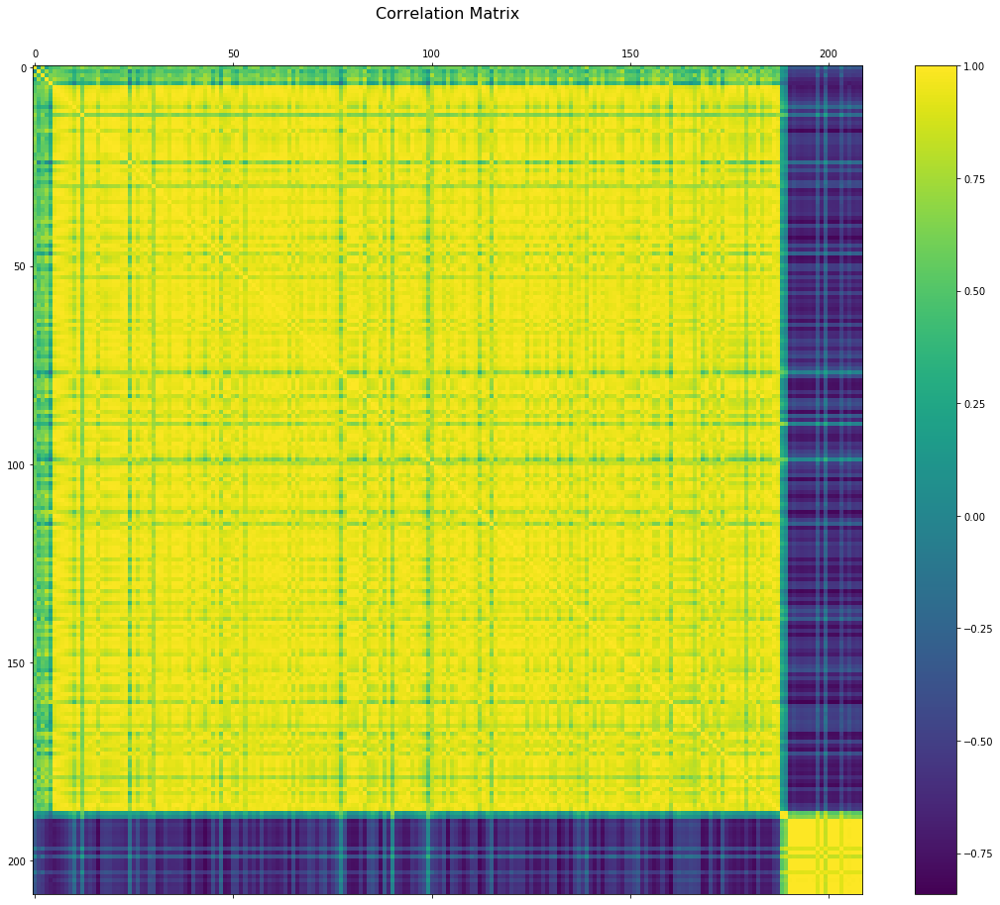

In [90]:
corr = pivoted_GDP_df.corr().values
pdist = spc.distance.pdist(corr)   # vector of ('55' choose 2) pairwise distances
linkage = spc.linkage(pdist, method='complete')
ind = spc.fcluster(linkage, 0.32*pdist.max(), 'distance')
columns = [pivoted_GDP_df.columns.tolist()[i] for i in list((np.argsort(ind)))]
clusterised_df = pivoted_GDP_df.reindex(columns, axis=1)

f = plt.figure(figsize=(19, 15))
plt.matshow(clusterised_df.corr(), fignum=f.number)
cb = plt.colorbar()
cb.ax.tick_params()
plt.title('Correlation Matrix', fontsize=16);

We have found regions in which the GDP is highly correlated and between which the correlation coefficent is lower. We could refine the big clusters by iterating this method.

**Interpretation:** The correlation matrix of GDP contains lots of values that are very closed to one. This means that **GDP in two different countries have a trend to evolve the same way**. Therefore, we can say that the world countries have **strong enough trading relations** to make the GDP evolve the same way. The fact that we have found some **main clusters** could be interpreted as regions in which the **trading relations are more important**.

C:\Users\Martin\.conda\envs\ada\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


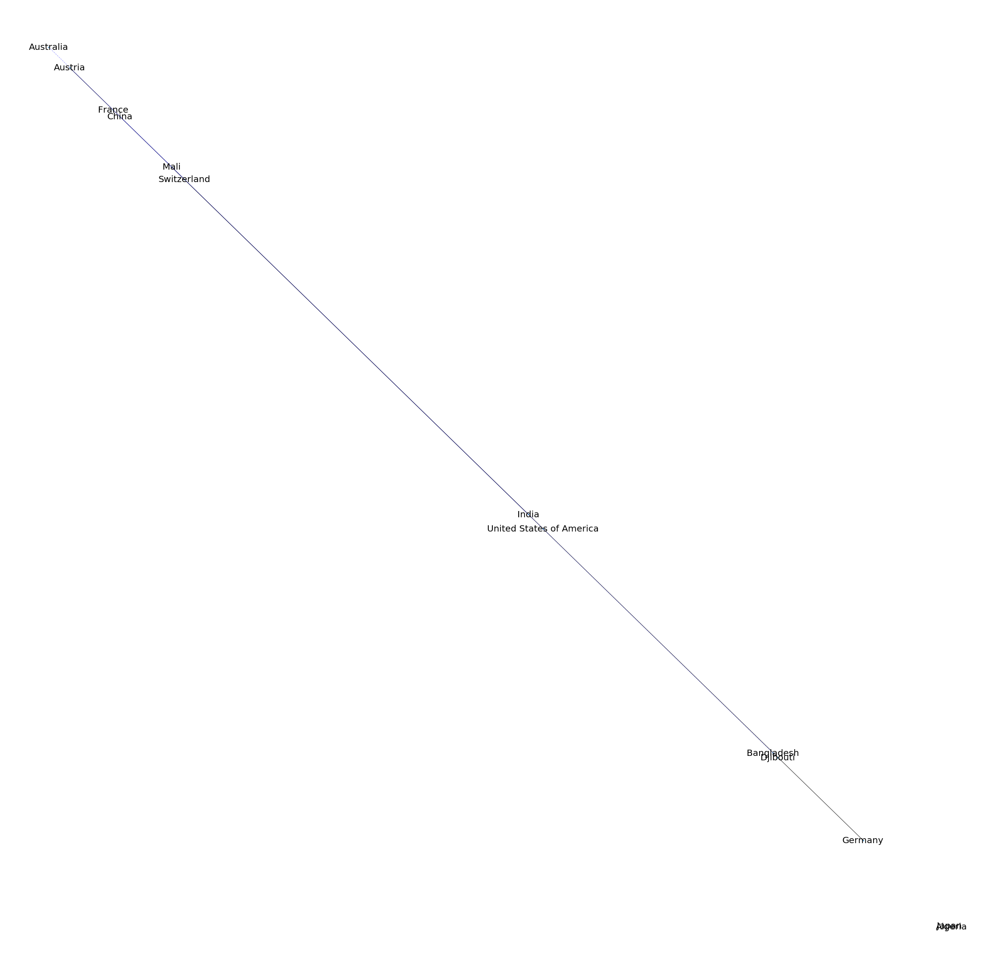

In [91]:
import networkx as nx


plt.figure(figsize=(40,40))

selected_countries = ['Algeria', 'Australia', 'Austria', 'Bangladesh', 'China',
                      'Djibouti', 'France', 'Germany', 'India', 'Japan', 'Mali',
                      'Switzerland', 'United States of America']

G =  nx.from_pandas_adjacency(pivoted_GDP_df[selected_countries].corr())

elarge = [(u, v) for (u, v, d) in G.edges(data=True) if d['weight'] > 0.99]
esmall = [(u, v) for (u, v, d) in G.edges(data=True) if 0.98 < d['weight'] <= 0.99]

pos = nx.spring_layout(G, k=0.01185)  # positions for all nodes

# nodes
nx.draw_networkx_nodes(G, pos, node_size=10, node_shape='.')

# edges
nx.draw_networkx_edges(G, pos, edgelist=elarge,
                       width=1, alpha=0.5)
nx.draw_networkx_edges(G, pos, edgelist=esmall,
                       width=1, alpha=0.2, edge_color='b', style='dashed')

# labels
nx.draw_networkx_labels(G, pos, font_size=20, font_family='sans-serif')

plt.axis('off')
plt.show()


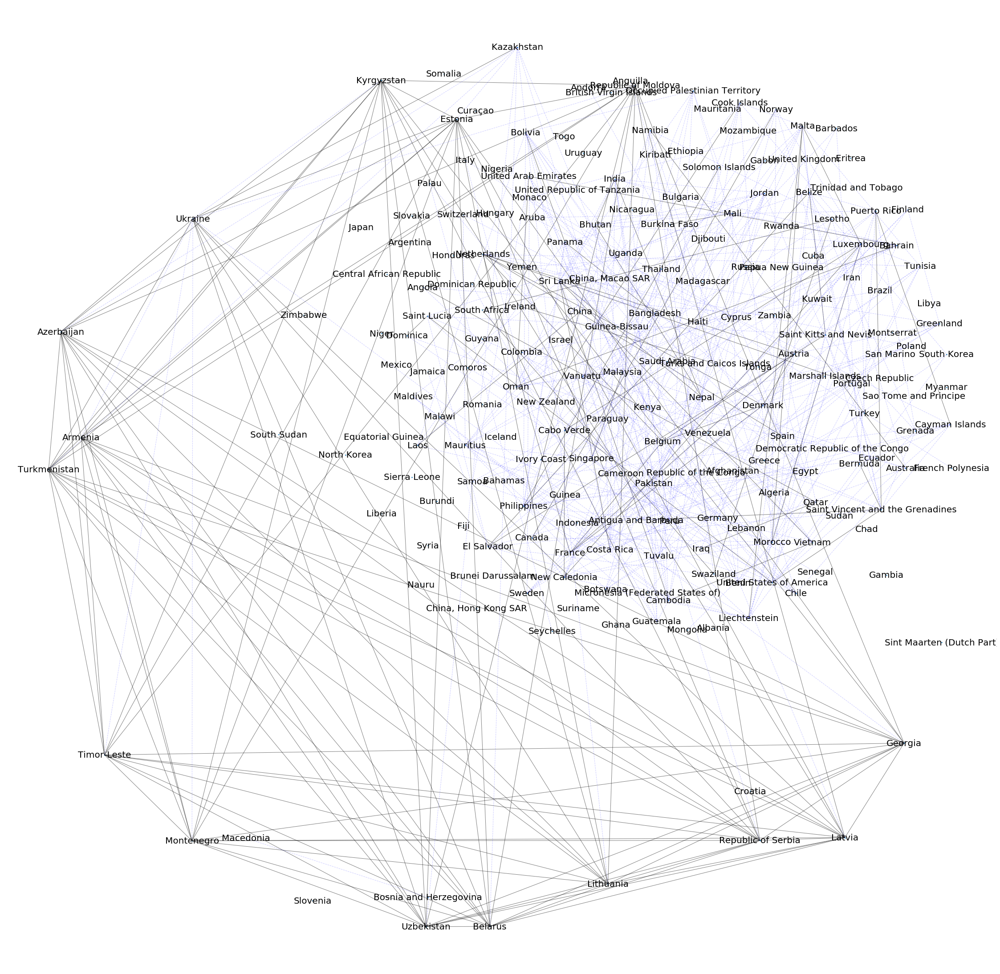

In [92]:
plt.figure(figsize=(40,40))

G =  nx.from_pandas_adjacency(pivoted_GDP_df.corr())

elarge = [(u, v) for (u, v, d) in G.edges(data=True) if d['weight'] > 0.995]
esmall = [(u, v) for (u, v, d) in G.edges(data=True) if 0.99 < d['weight'] <= 0.995]

pos = nx.spring_layout(G, k=2)  # positions for all nodes

# nodes
nx.draw_networkx_nodes(G, pos, node_size=10, node_shape='.')

# edges
nx.draw_networkx_edges(G, pos, edgelist=elarge,
                       width=1, alpha=0.5)
nx.draw_networkx_edges(G, pos, edgelist=esmall,
                       width=1, alpha=0.2, edge_color='b', style='dashed')

# labels
nx.draw_networkx_labels(G, pos, font_size=20, font_family='sans-serif')

plt.axis('off')
plt.show()

#### 2.D. Economic classification of countries <a name="2D"></a>
Below, we plot the distribution of GDP over the world for the last decades:

In [93]:
plot = uni_df[['Area','Year']]
plot["Value"] = uni_df["(GDP, million $)"]
interact(lambda x: visualise_world_data_folium(plot,'Value',x),x=(1990,2010,1))

C:\Users\Martin\.conda\envs\ada\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


interactive(children=(IntSlider(value=2000, description='x', max=2010, min=1990), Output()), _dom_classes=('wi…

<function __main__.<lambda>(x)>

The countries with high **GDP** indeed correpond to the most **developped countries**. The **trends we can observe** from those plots look **very significant** (USSR dissolution, China economic growth, ...)

### 3. Descriptive data analysis  <a name="3"></a>

3. 

    1. [Production and consumption of food from a time-space geography point of view](#3A)

    2. [Food self-sufficiency](#3B)

    3. [Analysis of food production and trade with GDP](#3C)
        
        1. [Correlation between production features and GDP](#3Ca)
        
        2. [Correlation between food trade features and GDP](#3Cb)
        
        3. [Machine learning model](#3Cc)  

    4. [Food prices stability and agricultural features](#3D)  
  

# 3. Descriptive analysis (NEW PROPOSITION)
3. 
    1. Identifying the most important features
        1. Feature selection
        2. GDP prediction
        3. CPI prediction
    2. Where are the most important features produced?
    3. Net importer/net exporters of the most important features
    4. Self sufficiency score based on the most important features
    

## A. Identifying the most important features

In [94]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.feature_selection import VarianceThreshold
from sklearn import linear_model
from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import RFE
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

def create_target_and_covariate_df(path_to_pkl):
    '''
    path_to_pkl: path to the pickle file.
    outputs two dataframes, one for the independant variables one for the dependant variables
    '''
    
    uni_df = pd.read_pickle(path_to_pkl)
    uni_df = uni_df.drop(columns=['Area', 'Year'])
    target_variables_df = uni_df[['(GDP, million $)', '(Consumer price indices, %)']]
    covariates_df = uni_df.drop(columns=['(GDP, million $)', '(Consumer price indices, %)'])
    
    return covariates_df, target_variables_df


def drop_feature_pearson_correlation(threshold, target_variable, target_variable_name, dataframe):
    
    '''
    threshold: the minimum amount of correlation required to keep the feature
    target_variable_name: string GDP or CPI
    normalised_dataset: the normalised dataset of feature
    target_variable: pandas series that contains the value of the target_varibale_name
    that we add to the normalised dataset
    
    '''
    copy_dataframe = dataframe.copy()
    copy_dataframe[target_variable_name] = target_variable
    cor = copy_dataframe.corr()
    cor_target = abs(cor[target_variable_name])
    
    relevant_features = cor_target[cor_target > threshold]
    
    return list(relevant_features.keys())

def drop_too_corelated_featues(threshold, dataframe):
    
    corr_matrix = dataframe.corr().abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
    to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
    
    return dataframe.drop(dataframe[to_drop], axis=1)
    

def feature_augmentation(degree, covariates_df):
    poly = PolynomialFeatures(degree)
    output_nparray =  poly.fit_transform(covariates_df)

    
    output_df = pd.DataFrame(output_nparray, columns = poly.get_feature_names(covariates_df.columns))
    
    return output_df

def split_and_standardization_dataset(target_variables, covariates, test_size, random, type_return = 'numpy'  ):
    
    '''
    
    target_variables: pandas dataframe that contains the target variables
    covariates: pandas dataframe that contains the independant variables
    test_size: the proportion of the dataset to include in the test split
    type_return: 'numpy' if return numpy array, 'pandas' if return pandas dataframe
    '''
    target_variables_numpy = target_variables.to_numpy()
    covariates_numpy = covariates.to_numpy()
    X_train, X_test, Y_train, Y_test = train_test_split(covariates_numpy, target_variables_numpy, test_size=test_size, random_state = random)
    scaler = preprocessing.StandardScaler().fit(X_train)
    X_train_normalized = scaler.transform(X_train)
    X_test_normalized = scaler.transform(X_test)
    
    if type_return == 'numpy':
        
        return X_train_normalized, X_test_normalized, Y_train, Y_test
    
    elif type_return == 'pandas':
        
        X_test_normalized_df = pd.DataFrame(X_test_normalized, columns = list(covariates.columns))
        X_train_normalized_df = pd.DataFrame(X_train_normalized,columns= list(covariates.columns))
        Y_train_df = pd.DataFrame(Y_train, columns= list(target_variables.columns))
        Y_test_df = pd.DataFrame(Y_test, columns= list(target_variables.columns))
        
        return X_train_normalized_df, X_test_normalized_df, Y_train_df, Y_test_df

def fit_model_lasso(regularisation_parameters, covariates_df, target_df, nb_fold_CV):
    
    lasso = Lasso()
    
    parameters = {'alpha': regularisation_parameters}
    
    lasso_regressor = GridSearchCV(lasso, parameters, scoring = 'neg_mean_squared_error', cv = nb_fold_CV)
    lasso_regressor.fit(covariates_df, target_df)

    best_param = lasso_regressor.best_params_['alpha']
    print('The best regularization parameter is ', best_param)


    lasso = Lasso(alpha=best_param)
    lasso.fit(covariates_df, target_df)
    return lasso.coef_
    
    
    
def RFECV_lasso_2(covariate, target,  random, nb_fold = 5,):
    
    cols = list(covariate.columns)
    X_train_, X_test_, Y_train_, Y_test_ = split_and_standardization_dataset(target, covariate, 0.2, type_return='numpy', random = random)
    #print('shape of Y_train_', Y_train_.shape, 'type of Y_train_', type(Y_train_))
    model = Lasso()
    
    rfecv = RFECV(estimator = model, step = 1, cv = nb_fold, scoring = 'neg_mean_squared_error')
    rfecv.fit(X_train_, np.ravel(Y_train_))
    print("Optimal number of features : %d" % rfecv.n_features_)
    
    temp = pd.Series(rfecv.support_,index = cols)
    selected_features = temp[temp==True].index

    print(selected_features)
    

    # plt.figure()
    # plt.xlabel("Number of features selected")
    # plt.ylabel("Cross validation score")
    # plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
    # plt.show()
        
    return selected_features



    

def main():

    RANDOM_SEED = 29

    params = {

        'target' : '(GDP, million $)',
        'name of target': 'GDP',
        'pearson correlation threshold': 0.4,
        'inter correlation threshold': 0.9, 
        'nb_fold_CV': 5, 
        'degree augmentation': 1




    }

    covariates_df, target_variables_df = create_target_and_covariate_df('./Scripts/Data/uni_df.pkl')
    target_variables_df.to_pickle('target.pkl')

    ### Below we are going to select the top 20 features in production:

    Production_cov_df = covariates_df.filter(regex= 'production|Production')
    summed_df = Production_cov_df.sum()
    keys = summed_df.keys()
    values = summed_df.values
    sorted_keys = [key for _,key in sorted(zip(values,keys))]
    Production_cov_df = Production_cov_df[sorted_keys[-20:]]
    selected_features_production = list(Production_cov_df.columns.values) # Selected features for top 20 prod features in volumne

    cropped_word_selected_prod = [" ".join(string.split()[:-3]) for string in selected_features_production] # Same as the list above with only the important words kept


    

   #-------------------------Below we are selecting the features in export that have been selected previously with the production--------------------------------------
    export_df = covariates_df.filter(regex= 'export')
    

    columns_to_keep_export = []

    for column_export in list(export_df.columns.values):

        for columns_prod in cropped_word_selected_prod:

            if columns_prod in column_export:

                columns_to_keep_export.append(column_export)


    #-------------------------Below we are selecting the features in import that have been selected previously with the production--------------------------------------
    import_df = covariates_df.filter(regex= 'import')
    

    columns_to_keep_import = []

    for column_import in list(import_df.columns.values):

        for columns_prod in cropped_word_selected_prod:

            if columns_prod in column_import:

                columns_to_keep_import.append(column_import)

    


    final_features_kept = selected_features_production + columns_to_keep_export + columns_to_keep_import  # All the selected features
    print('final features', final_features_kept)

    # summed_covariates_df = covariates_df.sum()
    # keys = summed_covariates_df.keys()
    # values = summed_covariates_df.values
    
    # sorted_keys = [key for _,key in sorted(zip(values,keys))]

    # covariates_df = covariates_df[sorted_keys[-30:]]
    covariates_df = covariates_df[final_features_kept]
    
    # covariates_df = feature_augmentation(2, covariates_df)
    print('list of all features', list(covariates_df.columns.values))
    list_selected_features_GDP = drop_feature_pearson_correlation(params['pearson correlation threshold'], target_variables_df[params['target']], params['name of target'], covariates_df)
    print('amount of selected features', len(list_selected_features_GDP))
    print('selected features', list_selected_features_GDP)
    covariate_reduced_df = covariates_df[list_selected_features_GDP[:-1]]

    covariate_reduced_df = drop_too_corelated_featues(params['inter correlation threshold'], covariate_reduced_df)
    covariate_reduced_df.to_pickle("reduced_df_2.pkl")
    print('list of selected features after reduction', list(covariate_reduced_df.columns.values))
    # covariate_reduced_df = feature_augmentation(params['degree augmentation'], covariate_reduced_df)

    # selected_features = RFECV_lasso_2(covariate_reduced_df, target_variables_df[[params['target']]], random = RANDOM_SEED)
    # selected_covariate = covariate_reduced_df[selected_features]

    regularisation_parameters = np.linspace(start = 0.01, stop= 1, num = 20)

    # covariate_reduced_df = covariate_reduced_df[list(selected_covariate.columns.values)]

    target_df = target_variables_df[params['target']]

    nb_fold_CV = params['nb_fold_CV']

    param_lasso = fit_model_lasso(regularisation_parameters, covariate_reduced_df, target_df, nb_fold_CV = nb_fold_CV )

    keys = list(covariate_reduced_df.columns.values)
    #keys = selected_features
    values = param_lasso
   
    return dict(zip(keys, values))

weights=main()

final features ['Sweet potatoes Crops Production tonnes', 'Soybeans Crops Production tonnes', 'Tomatoes Crops Production tonnes', 'Oats Crops Production tonnes', 'Buffaloes Livestock production Head', 'Cassava Crops Production tonnes', 'Barley Crops Production tonnes', 'Rabbits and hares Livestock production Head', 'Maize Crops Production tonnes', 'Goats Livestock production Head', 'Turkeys Livestock production Head', 'Ducks Livestock production Head', 'Sugar beet Crops Production tonnes', 'Potatoes Crops Production tonnes', 'Wheat Crops Production tonnes', 'Pigs Livestock production Head', 'Cattle Livestock production Head', 'Sheep Livestock production Head', 'Sheep and Goats Livestock production Head', 'Chickens Livestock production Head', 'Barley Food export quantities tonnes', 'Buffaloes Live animals export quantities Head', 'Cassava Food export quantities tonnes', 'Cattle Live animals export quantities Head', 'Chickens Live animals export quantities Head', 'Ducks Live animals expo

C:\Users\Martin\.conda\envs\ada\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22574769179207.75, tolerance: 641076863381.032
  positive)


The best regularization parameter is  0.01


In [95]:
weights

{'Soybeans Crops Production tonnes': 0.01690455171988309,
 'Tomatoes Crops Production tonnes': 0.04600299893471081,
 'Maize Crops Production tonnes': 0.019112555979080622,
 'Turkeys Livestock production Head': 0.00045609049200983894,
 'Maize Food export quantities tonnes': -0.06316454222878924,
 'Maize, green Food export quantities tonnes': 52.08283849392848,
 'Wheat Food export quantities tonnes': 0.007579959466075064,
 'Cattle Live animals import quantities Head': 0.03663454785851843,
 'Oats Food import quantities tonnes': 0.4837657071630528,
 'Pigs Live animals import quantities Head': 0.05776106945901834,
 'Tomatoes Food import quantities tonnes': 2.568655777314169,
 'Turkeys Live animals import quantities Head': 0.04929538371588097}

**Above, we see the features identified as the most important by our regression model**

#### TODO ANALYIS PAUL

## B. Where are the most important features produced?

After having identified the most important features with our prediction model, we want to have a look as to where they are produced.  

The first step is to select to columns corresponding to the production of the features of interest within our dataframe.

In [96]:
features=list(weights.keys())
df=pickle.load(open(pickle_file,'rb'))
df=df.set_index(['Area','Year'])

#To select the production of the features of interest, the dataframe is filtered with each feature. To reduce computation cost, the result is stored in a dictionnary and when all the features are treated turned into
#a pandas DataFrame

dic_to_plot={}

for feature in features:
    
    if 'Production' in feature or 'production' in feature:
        if len(df.filter(regex=feature).columns)==0:
            print('{} not found'.format(c))
        else:
            dic_to_plot.update(df.filter(regex=feature).to_dict())
            
    else:
        s=re.split(' Food| Live',feature)[0]
        s='^'+s
        s=(s+'.*Production.*tonnes$|'
           +s+'.*Production.*Head$|'
           +s+'.*production.*tonnes$|'
           +s+'.*production.*Head')
        if len(df.filter(regex=s).columns)==0:
            print('{} not found'.format(feature))
        else:
            dic_to_plot.update(df.filter(regex=s).to_dict())
            
prod_to_plot=pd.DataFrame(dic_to_plot)
prod_to_plot=prod_to_plot.reset_index().rename(columns={'level_0':'Area','level_1':'Year'})

NameError: name 'pickle_file' is not defined

#### Let's dive into the maps!

In [97]:
columns=[c for c in prod_to_plot.columns if c!='Area' and c!='Year']
for c in columns:
    print(c)
    display(interact(lambda x : visualise_world_data_folium(prod_to_plot,c,x,log2=True),x=(1970,2014,1)))


NameError: name 'prod_to_plot' is not defined

### TODO: Analysis (Julien)

In [98]:
#Exporting the results as HTML files
import os
import shutil

#Generate result files

#if needed, creating result directory
if not os.path.exists('./Scripts/Data/ResultsJulien'):
    os.mkdir('./Scripts/Data/ResultsJulien')
if not os.path.exists('./Scripts/Data/ResultsJulien/Producers'):
        os.mkdir('./Scripts/Data/ResultsJulien/Producers')
        
for c in prod_to_plot.columns:
    if c!='Year' and c!='Area':
        
        #if the dir already exists, remove it and create fresh one
        if os.path.exists('./Scripts/Data/ResultsJulien/Producers/{}'.format(c)):
            shutil.rmtree('./Scripts/Data/ResultsJulien/Producers/{}'.format(c))
        #wait for the deletion to be complete
        while os.path.exists('./Scripts/Data/ResultsJulien/Producers/{}'.format(c)):
            continue
        os.mkdir('./Scripts/Data/ResultsJulien/Producers/{}'.format(c))
        
        for year in range(1970,2015,1):
            m=visualise_world_data_folium(prod_to_plot,c,year,log2=True)
            save_name='./Scripts/Data/ResultsJulien/Producers/{}/{}_{}.html'.format(c,c,year)
            m.save(save_name)

NameError: name 'prod_to_plot' is not defined

#### 3.A. Production and consumption of food from a time-space geography point of view <a name="3A"></a>

For the next milestone, this part will be put to the end of the file and conducted for **specific agricultural features** (e.g. trade of crop most highly correlated to GDP) after the **most important ones** have been **identified**.

In [99]:
#exported items
exports_df_mass = uni_df.filter(like='export quantities tonnes')
exports_df_head = uni_df.filter(like='export quantities Head')

#imported items
imports_df_mass = uni_df.filter(like='import quantities tonnes')
imports_df_head = uni_df.filter(like='import quantities Head')

In [100]:
def plot_map_import_export(imported_and_exported_elt):
    if imported_and_exported_elt+' Food export quantities tonnes' in list(exports_df_mass):
        exp = imported_and_exported_elt+' Food export quantities tonnes'
        imp = imported_and_exported_elt+' Food import quantities tonnes'
        net_df = pd.concat([uni_df[['Area','Year']],exports_df_mass[exp],imports_df_mass[imp]], axis=1)
    if imported_and_exported_elt+' Live animals export quantities Head' in list(exports_df_head):
        exp = imported_and_exported_elt+' Live animals export quantities Head'
        imp = imported_and_exported_elt+' Live animals import quantities Head'
        net_df = pd.concat([uni_df[['Area','Year']],exports_df_head[exp],imports_df_head[imp]], axis=1)
    net_df["Value"] = net_df[exp]-net_df[imp]
    net_df["Value"] = np.sign(net_df["Value"]) * np.log(np.abs(net_df["Value"]) + 1) # kind of log scale positive and negative values
    for year in range(1980, 2015, 5):
        display(year, visualise_world_data_folium(net_df, 'Value', year, False, True))

In [101]:
plot_map_import_export('Apples')

1980

1985

1990

1995

2000

2005

2010

In [102]:
plot_map_import_export('Grapes')

1980

1985

1990

1995

2000

2005

2010

In [103]:
plot_map_import_export('Wheat')

1980

1985

1990

1995

2000

2005

2010

In [104]:
plot_map_import_export('Soybeans')

1980

1985

1990

1995

2000

2005

2010

In [105]:
plot_map_import_export('Maize')

1980

1985

1990

1995

2000

2005

2010

In [106]:
plot_map_import_export('Turkeys')

1980

1985

1990

1995

2000

2005

2010

#### 3.B. Food self-sufficiency <a name="3B"></a>
In this chapter, we take a look at the self suficiency score of the countries around the world and we focus on the agricultural features identified by our model.

In [107]:
pickle_file="Scripts/Data/uni_df.pkl"
df=pickle.load(open(pickle_file,'rb'))
sc=compute_self_suficiency(df,weights)
sc.reset_index(inplace=True)
sc=sc.rename(columns={'level_0':'Area','level_1':'Year'})

Soybeans Crops Production tonnes weight : 0.01690455171988309 agg from: {'Soybeans Crops Production tonnes': 0.01690455171988309}
Tomatoes Crops Production tonnes weight : 2.6146587762488798 agg from: {'Tomatoes Crops Production tonnes': 0.04600299893471081, 'Tomatoes Food import quantities tonnes': 2.568655777314169}
Maize Crops Production tonnes weight : -0.044051986249708616 agg from: {'Maize Crops Production tonnes': 0.019112555979080622, 'Maize Food export quantities tonnes': -0.06316454222878924}
Turkeys Livestock production Head weight : 0.04975147420789081 agg from: {'Turkeys Livestock production Head': 0.00045609049200983894, 'Turkeys Live animals import quantities Head': 0.04929538371588097}
Maize, green Food export quantities tonnes weight : 52.08283849392848 agg from: {'Maize, green Food export quantities tonnes': 52.08283849392848}
Wheat Food export quantities tonnes weight : 0.007579959466075064 agg from: {'Wheat Food export quantities tonnes': 0.007579959466075064}
Cattl

In [108]:
interact(lambda x: visualise_world_data_folium(sc,'Agg',x,log2=True),x=(1970,2015))

interactive(children=(IntSlider(value=1992, description='x', max=2015, min=1970), Output()), _dom_classes=('wi…

<function __main__.<lambda>(x)>

In [109]:
# This field generates the results and exports them as HTML files (1 map per year)

import os
import shutil

#Generate result files

#if needed, create result directories
if not os.path.exists('./Scripts//Data/ResultsJulien'):
    os.mkdir('./Scripts/Data/ResultsJulien')
    
#if directory already exists delete it
if os.path.exists('./Scripts/Data/ResultsJulien/SelfSufficiency'):
    shutil.rmtree('./Scripts/Data/ResultsJulien/SelfSufficiency')

#While loop necessary to wait until the tree is deleted
while os.path.exists('./Scripts/Data/ResultsJulien/SelfSufficiency'):
    continue
    
os.mkdir('./Scripts/Data/ResultsJulien/SelfSufficiency')
    

for year in range(1970,2016,1):
            m=visualise_world_data_folium(sc,'Agg',year,log2=True)
            save_name='./Scripts/Data/ResultsJulien/SelfSufficiency/self_suf_{}.html'.format(year)
            m.save(save_name)




# TO DELETE




### 4. Informed plan for next actions  <a name="4"></a>

With **clean dataframes** we can now really focus on **producing some interesting results**. Our initial idea was to observe the **effects of different crops and food items on the economic growth** of the countries as well as the **differences in self-sufficiency**. Along the exploration of the data, we turned our attention toward prediction models. Training a **Ridge model** on our data will allow us to identify the **agricultural products** that are the **most correlated** with the **economic growth** of countries (predict the GDP based on agricultural features). The second model (prediction of the CPI variation rate) will allow us to identify **products linked with economic stability**.  

The identification of such items would give an **interesting insight toward understanding geopolotical strategies and challenges**. Further insight might be gained by identifying **who** the producers of these "economically strong" crops and animal products are and visualising the **geographical repartition of the most important ressources**. 

Our objectives for the following weeks are:
1. Revise the order of analysis - for instance putting net food exporters and importers at the end of the notebook. 
2. Fine tune our machine learning models by finding satisfying and meaningful ways to normalise the data without introducing bias, by doing a meaningful parameter optimisation and by removing aggregation variables such as "Rice-total".
3. Identify the "strong" agricultural products.
4. Find a clean way to calculate price stability with the given CPI values.
5. Create a model for price stability and correlating it to different agricultural products.
6. Identify the products we want to use for the self-sufficiency calculation.
7. Compute the correlation between price stability and self-sufficiency.
8. Visualise the repartition of the production of "strong" products as well as their trading flow (who buys, who sells).
9. Share our results in the form of a data story.